# TELECOM CHURN PREDICTIONS

`Background:` In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.


` Aim:`This telecom company wants to predict which customers are at the highest risk of churning. And identify factors which lead to churn

- [Data Reading](#Read)
- [Data Preperation](#Prep)
- [Exploratory Data Analysis](#EDA)
- [Train-test Split](#TT)
- [Scaling the data](#Sc)
- [Modelling](#Model)


In [1]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [206]:
#importing all the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.impute import KNNImputer
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score

#Modules necessary for Logistic regression
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import metrics
from sklearn.metrics import precision_score, recall_score

#Modules necessary of Tree models
from sklearn.tree import DecisionTreeClassifier
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import GridSearchCV

#Modules necessary for RandomForest
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA

from sklearn.model_selection import GridSearchCV

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

<a id="Read"></a>

## READING THE DATA

In [4]:
#reading the csv file and printing its shape
data = pd.read_csv('telecom_churn_data.csv')
print(data.shape)

(99999, 226)


In [5]:
#Let's have a quick look at the data
data.head(5)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [6]:
#Some statistical insights
data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [7]:
#Checking data types and null values of columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


<a id="Prep"></a>
## DATA PREPERATION

> ### Checking for null values

In [8]:
data.isnull().sum()/len(data)

mobile_number               0.000000
circle_id                   0.000000
loc_og_t2o_mou              0.010180
std_og_t2o_mou              0.010180
loc_ic_t2o_mou              0.010180
last_date_of_month_6        0.000000
last_date_of_month_7        0.006010
last_date_of_month_8        0.011000
last_date_of_month_9        0.016590
arpu_6                      0.000000
arpu_7                      0.000000
arpu_8                      0.000000
arpu_9                      0.000000
onnet_mou_6                 0.039370
onnet_mou_7                 0.038590
onnet_mou_8                 0.053781
onnet_mou_9                 0.077451
offnet_mou_6                0.039370
offnet_mou_7                0.038590
offnet_mou_8                0.053781
offnet_mou_9                0.077451
roam_ic_mou_6               0.039370
roam_ic_mou_7               0.038590
roam_ic_mou_8               0.053781
roam_ic_mou_9               0.077451
roam_og_mou_6               0.039370
roam_og_mou_7               0.038590
r

Imputing meaningful null values

In [9]:
data.loc[(data['vol_2g_mb_6']==0) & (data['total_rech_data_6'].isnull()) & (data['vol_3g_mb_6']==0),'total_rech_data_6']=0
data.loc[(data['vol_2g_mb_7']==0) & (data['total_rech_data_7'].isnull()) & (data['vol_3g_mb_7']==0),'total_rech_data_7']=0
data.loc[(data['vol_2g_mb_8']==0) & (data['total_rech_data_8'].isnull()) & (data['vol_3g_mb_8']==0),'total_rech_data_8']=0
data.loc[(data['vol_2g_mb_9']==0) & (data['total_rech_data_9'].isnull()) & (data['vol_3g_mb_9']==0),'total_rech_data_9']=0

data.loc[(data['vol_2g_mb_6']==0) & (data['max_rech_data_6'].isnull()) & (data['vol_3g_mb_6']==0),'max_rech_data_6']=0
data.loc[(data['vol_2g_mb_7']==0) & (data['max_rech_data_7'].isnull()) & (data['vol_3g_mb_7']==0),'max_rech_data_7']=0
data.loc[(data['vol_2g_mb_8']==0) & (data['max_rech_data_8'].isnull()) & (data['vol_3g_mb_8']==0),'max_rech_data_8']=0
data.loc[(data['vol_2g_mb_9']==0) & (data['max_rech_data_9'].isnull()) & (data['vol_3g_mb_9']==0),'max_rech_data_9']=0

data.loc[(data['vol_2g_mb_6']==0) & (data['av_rech_amt_data_6'].isnull()) & (data['vol_3g_mb_6']==0),'av_rech_amt_data_6']=0
data.loc[(data['vol_2g_mb_7']==0) & (data['av_rech_amt_data_7'].isnull()) & (data['vol_3g_mb_7']==0),'av_rech_amt_data_7']=0
data.loc[(data['vol_2g_mb_8']==0) & (data['av_rech_amt_data_8'].isnull()) & (data['vol_3g_mb_8']==0),'av_rech_amt_data_8']=0
data.loc[(data['vol_2g_mb_9']==0) & (data['av_rech_amt_data_9'].isnull()) & (data['vol_3g_mb_9']==0),'av_rech_amt_data_9']=0

data.loc[(data['vol_2g_mb_6']==0) & (data['count_rech_2g_6'].isnull()) ,'count_rech_2g_6']=0
data.loc[(data['vol_2g_mb_7']==0) & (data['count_rech_2g_7'].isnull()) ,'count_rech_2g_7']=0
data.loc[(data['vol_2g_mb_8']==0) & (data['count_rech_2g_8'].isnull()) ,'count_rech_2g_8']=0
data.loc[(data['vol_2g_mb_9']==0) & (data['count_rech_2g_9'].isnull()) ,'count_rech_2g_9']=0

data.loc[(data['vol_3g_mb_6']==0) & (data['count_rech_3g_6'].isnull()) ,'count_rech_3g_6']=0
data.loc[(data['vol_3g_mb_7']==0) & (data['count_rech_3g_7'].isnull()) ,'count_rech_3g_7']=0
data.loc[(data['vol_3g_mb_8']==0) & (data['count_rech_3g_8'].isnull()) ,'count_rech_3g_8']=0
data.loc[(data['vol_3g_mb_9']==0) & (data['count_rech_3g_9'].isnull()) ,'count_rech_3g_9']=0

Dropping columns with null values more than 50%

In [10]:
data.isnull().sum()/len(data)

mobile_number               0.000000
circle_id                   0.000000
loc_og_t2o_mou              0.010180
std_og_t2o_mou              0.010180
loc_ic_t2o_mou              0.010180
last_date_of_month_6        0.000000
last_date_of_month_7        0.006010
last_date_of_month_8        0.011000
last_date_of_month_9        0.016590
arpu_6                      0.000000
arpu_7                      0.000000
arpu_8                      0.000000
arpu_9                      0.000000
onnet_mou_6                 0.039370
onnet_mou_7                 0.038590
onnet_mou_8                 0.053781
onnet_mou_9                 0.077451
offnet_mou_6                0.039370
offnet_mou_7                0.038590
offnet_mou_8                0.053781
offnet_mou_9                0.077451
roam_ic_mou_6               0.039370
roam_ic_mou_7               0.038590
roam_ic_mou_8               0.053781
roam_ic_mou_9               0.077451
roam_og_mou_6               0.039370
roam_og_mou_7               0.038590
r

In [11]:
cols=data.columns

for i in cols:
    if data[i].isnull().sum()/len(data) > 0.5:
        data.drop(columns=i,inplace=True)

In [12]:
data.shape

(99999, 206)

In [13]:
data.isnull().sum()/len(data)

mobile_number           0.000000
circle_id               0.000000
loc_og_t2o_mou          0.010180
std_og_t2o_mou          0.010180
loc_ic_t2o_mou          0.010180
last_date_of_month_6    0.000000
last_date_of_month_7    0.006010
last_date_of_month_8    0.011000
last_date_of_month_9    0.016590
arpu_6                  0.000000
arpu_7                  0.000000
arpu_8                  0.000000
arpu_9                  0.000000
onnet_mou_6             0.039370
onnet_mou_7             0.038590
onnet_mou_8             0.053781
onnet_mou_9             0.077451
offnet_mou_6            0.039370
offnet_mou_7            0.038590
offnet_mou_8            0.053781
offnet_mou_9            0.077451
roam_ic_mou_6           0.039370
roam_ic_mou_7           0.038590
roam_ic_mou_8           0.053781
roam_ic_mou_9           0.077451
roam_og_mou_6           0.039370
roam_og_mou_7           0.038590
roam_og_mou_8           0.053781
roam_og_mou_9           0.077451
loc_og_t2t_mou_6        0.039370
loc_og_t2t

For remaing columns with null values, we'll impute it using KNN imputer

In [14]:
d=data.copy()

In [15]:
data.drop(columns=["last_date_of_month_6","last_date_of_month_7","last_date_of_month_8","last_date_of_month_9",'date_of_last_rech_6','date_of_last_rech_7', 'date_of_last_rech_8',
       'date_of_last_rech_9'],inplace=True)

In [16]:
cols=data.columns

for i in cols:
    if data[i].isnull().sum()/len(data) > 0:
        data[i].fillna(data[i].quantile(0.5),inplace=True)

> ### Calculating high value customers

High Value Customers(HVC) are decided by calculating monthly recharge average of each customer and taking the top 70%ile of it.

In [17]:
#Calculating Total Recharge for the month of June
data['Recharge6']=data['total_rech_amt_6'] + (data['total_rech_data_6']* data['av_rech_amt_data_6'])
#Calculating the total recharge for the month of July
data['Recharge7']=data['total_rech_amt_7'] + (data['total_rech_data_7']* data['av_rech_amt_data_7'])
#Calculating averageRecharge of month june and july
data['avgRecharge']=(data['Recharge6']+data['Recharge7'])/2

In [18]:
#Creating new dataset which contains top 70%ile
q=data['avgRecharge'].quantile(0.7)
hvc_data = data[data['avgRecharge']>q]

In [19]:
hvc_data.shape

(29953, 201)

> ### Creating Target Variable

In the the september month, if the customer has has 0 incoming call, 0 outgoing calls, 0 2g data usage and 0 3g data usage. Then we can conclude that the customer will churn next month 

In [20]:
#Taking sum of total_ic_mou_9,total_og_mou_9, vol_2g_mb_9,vol_3g_mb_9 to make decision
hvc_data['Prep_target']=hvc_data['total_ic_mou_9']+hvc_data['total_og_mou_9'] + hvc_data['vol_2g_mb_9'] + hvc_data['vol_3g_mb_9']

In [21]:
#Making target variable using prep_target column
hvc_data['Target']=hvc_data['Prep_target'].apply(lambda x:1 if x==0 else 0)

In [22]:
hvc_data.tail(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Recharge6,Recharge7,avgRecharge,Prep_target,Target
99957,7002108597,109,0.0,0.0,0.0,1090.075,659.300,974.759,1061.843,196.99,70.01,251.91,464.26,1222.56,692.49,707.68,799.29,5.58,0.00,0.00,0.00,31.06,0.00,0.00,0.00,8.81,2.71,14.19,81.13,181.56,183.96,49.03,77.16,0.00,0.00,0.00,0.28,0.00,0.00,0.00,0.00,190.38,186.68,63.23,158.58,180.94,67.29,237.71,383.13,1006.89,504.84,651.63,719.73,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1187.84,572.14,889.34,1102.86,0.0,0.0,0.0,0.0,16.66,3.68,11.01,2.11,0.00,0.0,0.0,0.0,1394.89,762.51,963.59,1263.56,8.61,18.09,20.09,28.58,57.09,109.56,46.09,75.33,1.13,0.00,1.68,0.98,66.84,127.66,67.88,104.89,0.00,0.00,0.30,16.23,8.11,23.36,5.64,14.16,0.00,0.00,15.08,0.00,0.0,0.0,0.0,0.0,8.11,23.36,21.03,30.39,83.46,190.63,91.49,135.29,0.00,0.24,0.0,0.00,8.50,0.00,0.00,0.00,0.00,39.34,2.58,0.00,17,10,19,21,1376,672,1225,1234,154,152,144,130,110,98,70,70,3.0,4.0,5.0,4.0,154.0,152.0,98.0,98.0,3.0,3.0,5.0,4.0,0.0,1.0,0.0,0.0,350.0,500.0,409.0,392.0,2198.07,304.58,66.08,69.40,0.00,1007.51,1877.48,1777.24,1,0,0,0,2,3,5,4,0,0,0,0,0,1,0,0,1214,1729.06,1151.35,0.0

Droppng columns with values for september month

In [23]:
cols=data.columns.values

In [24]:
#Dropping cols which ends where it's name endswith 9
for i in cols:
    if i.endswith("9"):
        hvc_data.drop(columns=i,inplace=True)

In [25]:
#Dropping cols with sept name
hvc_data.drop(columns='sep_vbc_3g',inplace=True)

In [26]:
hvc_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Recharge6,Recharge7,avgRecharge,Prep_target,Target
0,7000842753,109,0.0,0.0,0.0,197.385,214.816,213.803,34.31,32.33,0.00,96.31,91.735,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.91,11.61,0.00,41.03,40.43,0.00,0.00,0.00,0.00,0.0,0.0,0.00,65.11,63.685,0.00,0.00,0.00,0.00,3.95,3.635,0.00,0.00,0.00,0.00,0.0,0.0,0.0,11.64,11.09,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,15.69,15.74,0.16,56.49,57.08,4.13,0.88,0.93,1.15,92.16,92.55,5.44,0.00,0.00,0.00,2.03,2.04,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.89,5.96,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,0,0,0,0,0,0,1,1,1,0,0,0,968,30.40,0.00,101.20,614.0,504.0,559.0,0.00,1
7,7000701601,109,0.0,0.0,0.0,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.160,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.910,255.79,4.30,23.29,12.01,49.89,31.760,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1580.0,790.0,1185.0,0.00,1
8,7001524846,109,0.0,0.0,0.0,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.630,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.1

In [27]:
hvc_data.shape

(29953, 155)

<a id="EDA"></a>
## EXPLORATORY DATA ANALYSIS

**Visualising Target Variable**

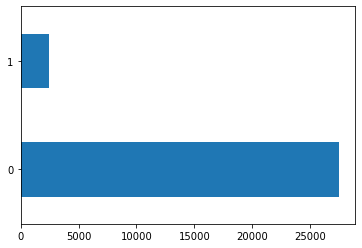

In [28]:
hvc_data.Target.value_counts().plot.barh()
plt.show()

`Conclusion`: The target variable is extremely imbalaced. Which needs to be balanced before modelling

**Understaning average revenue per user for june,july, august**

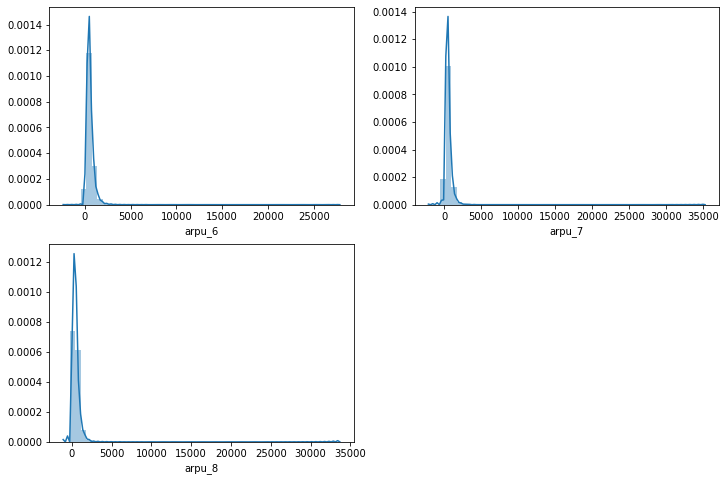

In [29]:
plt.figure(figsize=[12,8])
plt.subplot(2,2,1)
sns.distplot(hvc_data['arpu_6'])
plt.subplot(2,2,2)
sns.distplot(hvc_data['arpu_7'])
plt.subplot(2,2,3)
sns.distplot(hvc_data['arpu_8'])
plt.show()

`Conclusion`:
There are few outliers, 

**Understanding distribution of circle**

In [30]:
hvc_data['circle_id'].value_counts()

109    29953
Name: circle_id, dtype: int64

`Conclusion`:

In [31]:
hvc_data.drop(columns="circle_id",inplace=True)

**Understanding total_rech_amt for June, July, August**

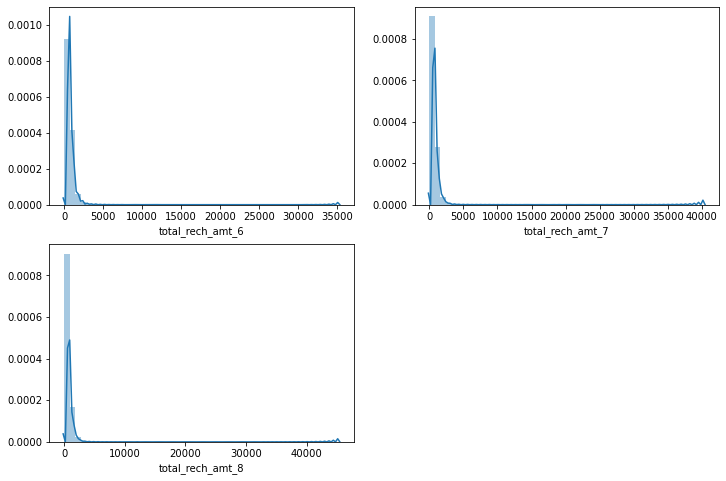

In [32]:
plt.figure(figsize=[12,8])
plt.subplot(2,2,1)
sns.distplot(hvc_data['total_rech_amt_6'])
plt.subplot(2,2,2)
sns.distplot(hvc_data['total_rech_amt_7'])
plt.subplot(2,2,3)
sns.distplot(hvc_data['total_rech_amt_8'])
plt.show()

`Conclusion`: The distribution of the rech amount is more or less similar for all three months. However, in the month of august, the distribution is mostly between (0,10000 unlike previous months which had it in between (0,5000)

**Understanding the data usage over the months**

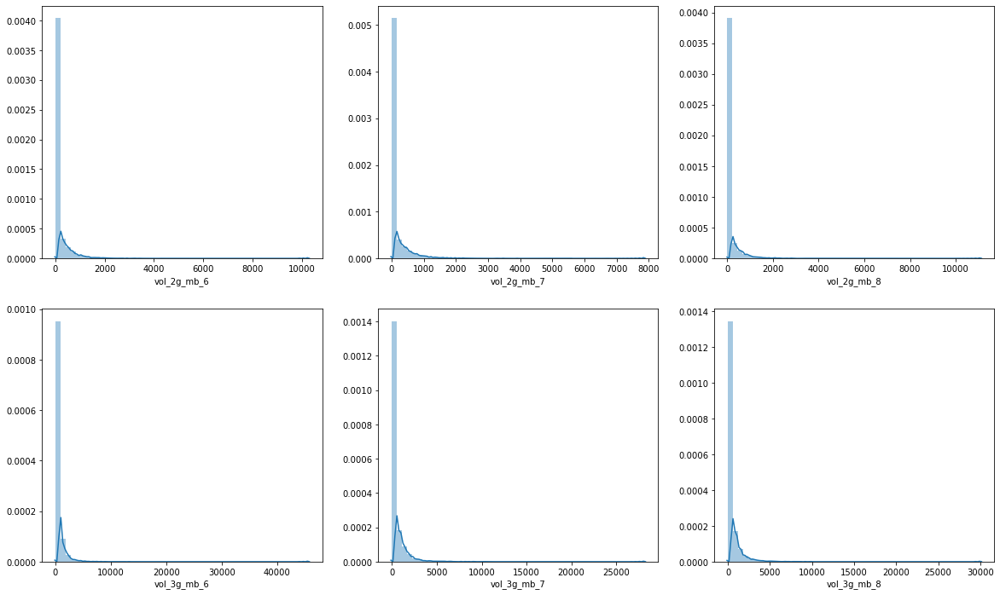

In [33]:
plt.figure(figsize=[20,12])
plt.subplot(2,3,1)
sns.distplot(hvc_data['vol_2g_mb_6'])
plt.subplot(2,3,2)
sns.distplot(hvc_data['vol_2g_mb_7'])
plt.subplot(2,3,3)
sns.distplot(hvc_data['vol_2g_mb_8'])
plt.subplot(2,3,4)
sns.distplot(hvc_data['vol_3g_mb_6'])
plt.subplot(2,3,5)
sns.distplot(hvc_data['vol_3g_mb_7'])
plt.subplot(2,3,6)
sns.distplot(hvc_data['vol_3g_mb_8'])
plt.show()

`Conclusion`:  The distribution of the data columns are more or less similar

>- ### Outlier Treatment

In [34]:
hvc_data.columns.values

array(['mobile_number', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6',
       'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7',
       'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8',
       'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8',
       'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8',
       'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8',
       'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8',
       'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6',
       'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6',
       'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6',
       'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6',
       'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og

In [35]:
temp1=hvc_data.iloc[:,:50]
temp2=hvc_data.iloc[:,50:100]
temp3=hvc_data.iloc[:,100:]

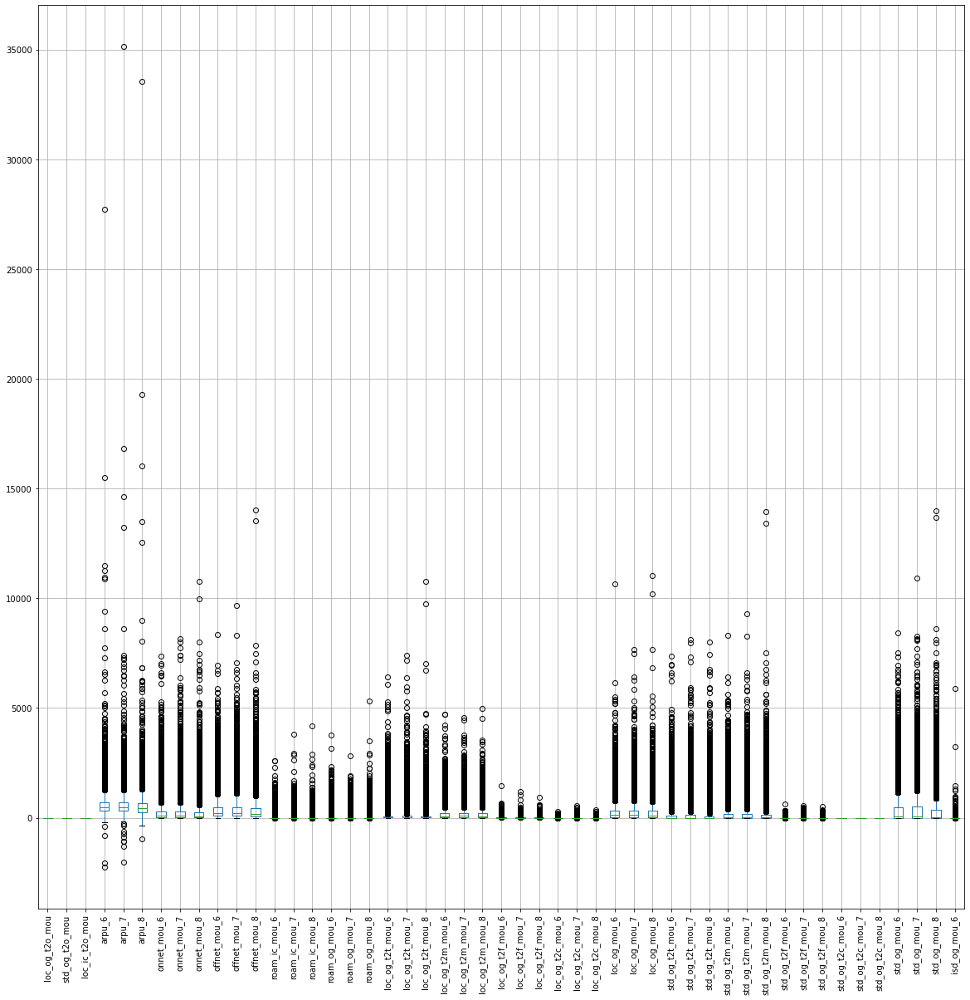

In [36]:
plt.figure(figsize=[20,20])
temp1.drop(columns="mobile_number").boxplot()
plt.xticks(rotation=90)
plt.show()

`Conclusion`: Except for loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,
std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8 all the columns require upper soft capping. 

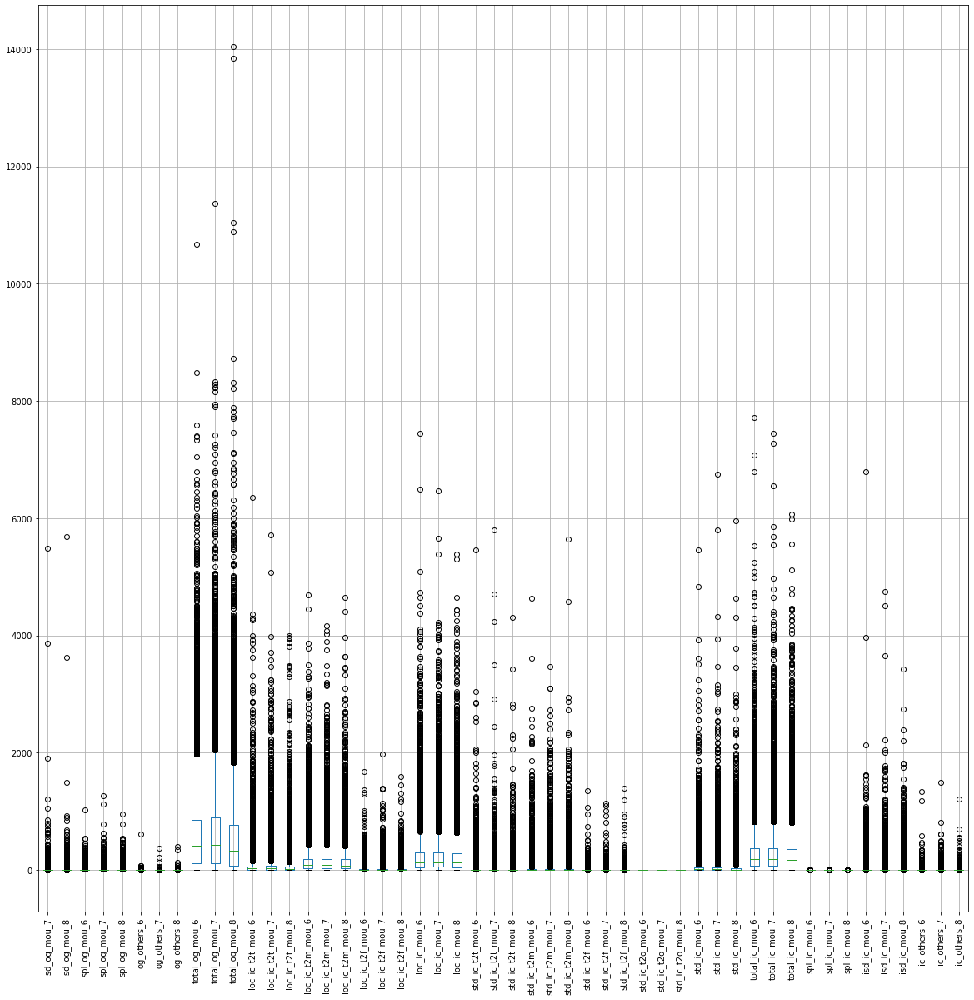

In [37]:
plt.figure(figsize=[20,20])
temp2.boxplot()
plt.xticks(rotation=90)
plt.show()

`Conclusion:` std_ic_t20_mou_6,std_ic_t20_mou_7,std_ic_t20_mou_8, spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8 do not need any utlier treatment. Rest all need it

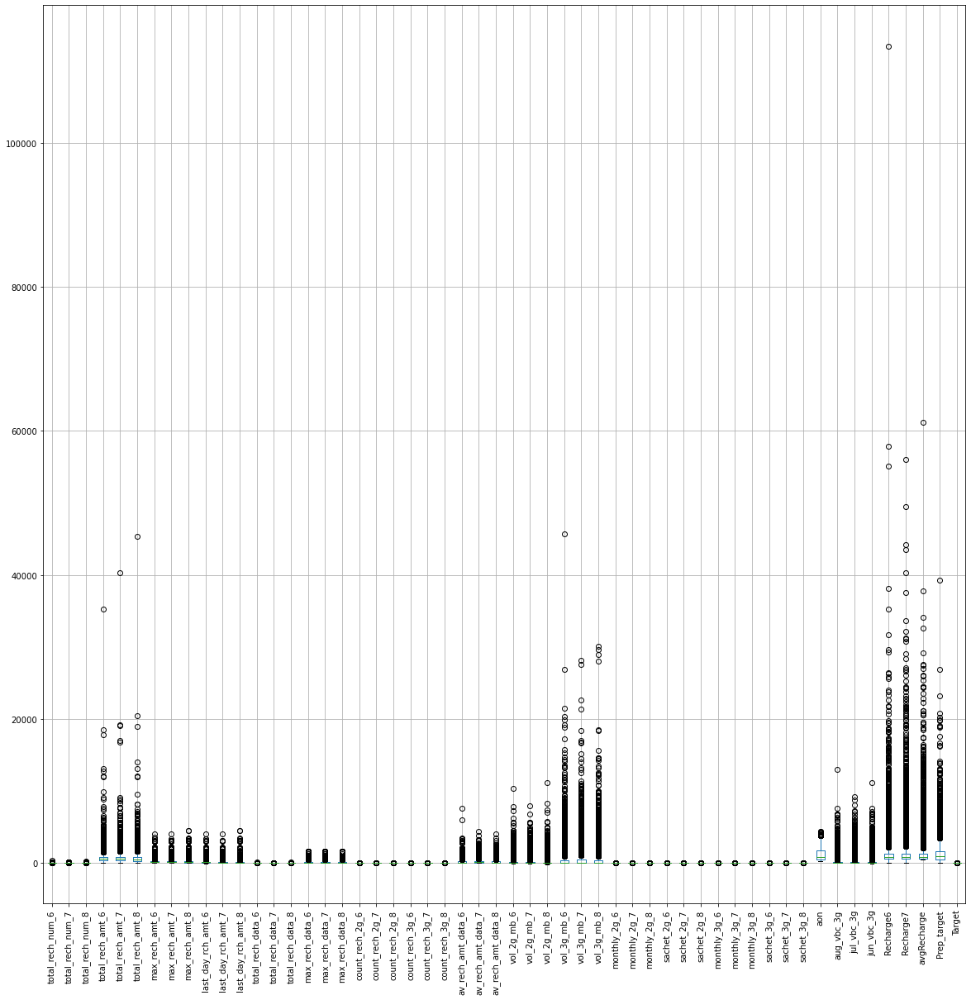

In [38]:
plt.figure(figsize=[20,20])
temp3.boxplot()
plt.xticks(rotation=90)
plt.show()

`Conclusion: ` total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,Target

In [39]:
c=hvc_data.copy()

**Soft Caping outlier with 95th percentile value**

In [40]:
colss=["std_ic_t2o_mou_6","std_ic_t2o_mou_7","std_ic_t2o_mou_8","spl_ic_mou_6","spl_ic_mou_7","spl_ic_mou_8","loc_og_t2f_mou_6","loc_og_t2f_mou_7","loc_og_t2f_mou_8","loc_og_t2c_mou_6","loc_og_t2c_mou_7","loc_og_t2c_mou_8","std_og_t2f_mou_6","std_og_t2f_mou_7","std_og_t2f_mou_8","std_og_t2c_mou_6","std_og_t2f_mou_7","std_og_t2f_mou_8",
      "total_rech_num_6","total_rech_num_7","total_rech_num_8","total_rech_data_6","total_rech_data_7","total_rech_data_8","count_rech_2g_6","count_rech_2g_7","count_rech_2g_8",
       "count_rech_3g_6","count_rech_3g_7","count_rech_3g_8","monthly_2g_6","monthly_2g_7","monthly_2g_8","monthly_3g_6","monthly_3g_7","monthly_3g_8","sachet_2g_6","sachet_2g_7",
       "sachet_2g_8","sachet_3g_6","sachet_3g_7","sachet_3g_8","Target"]

cols=hvc_data.drop(columns=colss).columns
for col in cols:
    percentiles = hvc_data[col].quantile([0.01,0.95]).values
    hvc_data[col][hvc_data[col] >= percentiles[1]] = percentiles[1]

>- ### Balancing the target variable

In [41]:
hvc_data.head()

,mobile_number,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Recharge6,Recharge7,avgRecharge,Prep_target,Target
0,7.000843e+09,0.0,0.0,0.0,197.385,214.8160,213.8030,34.31,32.33,0.00,96.31,91.735,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.91,11.61,0.00,41.03,40.43,0.00,0.00,0.00,0.00,0.0,0.0,0.00,65.11,63.685,0.00,0.00,0.00,0.00,3.95,3.635,0.000,0.00,0.00,0.00,0.0,0.0,0.0,11.64,11.09,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,15.69,15.74,0.16,56.49,57.08,4.13,0.880,0.93,1.15,92.16,92.55,5.44,0.00,0.00,0.00,2.03,2.04,0.000,0.00,0.00,0.00,0.0,0.0,0.0,5.89,5.96,0.000,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.000,0.000,4,3,2,362,252.0,252,252,252,252.0,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,0,0,0,0,0,0,1,1,1,0,0,0,968,30.40,0.00,101.20,614.0,504.0,559.0,0.00,1
7,7.000702e+09,0.0,0.0,0.0,1069.180,1261.8856,1255.0864,57.84,54.68,52.29,453.43,567.160,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.910,255.79,4.30,23.29,12.01,49.89,31.760,49.140,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,0.36,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,71.656,73.38,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,122.11,114.092,11.18,11.54,10.51,0.0,0.0,0.0,180.54,173.08,180.936,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,3.41,4.594,3.748,5,5,7,1480,790.0,1491,459,459,443.6,0,0,252,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1580.0,790.0,1185.0,0.00,1
8,7.001525e+09,0.0,0.0,0.0,378.721,492.2230,137.3620,413.69,351.03,35.08,94.66,80.630,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7

In [42]:
X=hvc_data.drop(columns=['mobile_number','Prep_target','Target'])
y= hvc_data['Target']

In [43]:
smote = SMOTE(random_state=0)
X_smote, y_smote = smote.fit_resample(X, y)

<a id="TT"></a>
## TRAIN-TEST SPLIT

In [44]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, train_size=0.7, test_size=0.3, random_state=100)

In [45]:
X_train.shape

(38528, 151)

In [46]:
X_test.shape

(16512, 151)

<a id="Sc"></a>
## SCALING THE DATA

In [47]:
from sklearn.preprocessing import StandardScaler

In [48]:
X_train.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Recharge6,Recharge7,avgRecharge
33036,0.0,0.0,0.0,688.094305,442.680297,7.137222,143.394427,389.416902,23.5671,1256.662,487.975934,68.111642,0.000,9.499593,0.918661,0.00,87.423372,4.312935,20.298607,2.538153,8.231333,19.880729,1.936784,28.321959,0.266659,0.00,0.0,0.00,0.00,0.00,40.445994,4.481955,44.721469,123.088803,297.309499,0.00,932.15,447.825533,2.322738,0.0,0.00,0.0,0.0,0.0,0.0,1552.956,745.135033,7.305045,0.0,0.0,0.0,0.450383,1.383849,0.00,0.149133,0.0,0.0,1708.773741,751.013819,0.00,9.893981,8.252385,11.248786,22.830185,4.903013,40.868952,11.283873,1.150843,0.652612,44.018039,14.313258,65.843644,8.648967,2.351913,0.00,20.30935,5.188345,1.424519,0.0,0.0,0.0,0.0,0.0,0.0,28.958317,7.540258,4.126192,73.431269,21.860532,0.00,0.301745,0.0,0.0,0.00,0.0,0.0,0.143168,0.0,0.0,15,7,4,771,493.505076,8,110,110,8.947998,39,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,426,0.0,0.0,0.0,771.613867,493.505076,632.559472
2428,0.0,0.0,0.0,560.891000,1261.885600,1255.086400,1088.160000,1187.712000,1075.3840,12.960,101.710000,71.140000,84.628,0.000000,0.000000,48.41,0.000000,0.000000,2.490000,55.080000,25.130000,2.910000,39.660000,46.580000,0.000000,0.00,0.0,2.41,4.93,1.11,5.410000,94.740000,71.710000,965.770000,1012.330000,888.03,6.13,57.110000,23.440000,0.0,0.00,0.0,0.0,0.0,0.0,1045.780,1615.610000,1476.200000,0.0,0.0,0.0,5.880000,10.290000,3.83,0.000000,0.0,0.0,1057.080000,1951.870000,1857.20,28.240000,30.210000,15.480000,11.540000,63.730000,70.860000,0.000000,0.000000,0.000000,39.790000,93.940000,86.340000,60.210000,62.180000,56.25,0.00000,81.640000,4.510000,0.0,0.0,0.0,0.0,0.0,0.0,70.560000,188.710000,180.936000,110.360000,282.660000,268.99,0.000000,0.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.0,36,64,76,662,1510.400000,1491,50,150,150.000

In [49]:
scaler = StandardScaler()
X_train_scale= scaler.fit_transform(X_train.values)

In [50]:
X_train = pd.DataFrame(X_train_scale, columns=X_train.columns, index=X_train.index)

<a id="Model"></a>
## MODELLING

We don't want to label a customer as non-churn, when he might actually churn. Hence Sensitivity will be our goto metric

- [Logistic Regression](#LogREG)
- [Decision Tree](#DT)
- [Random Forest](#RF)
- [Decision Tree with PCA](#DTPCA)
- [Custom Model](#CUST)

<a id="LogREG"></a>
>### LOGISTIC REGRESSION

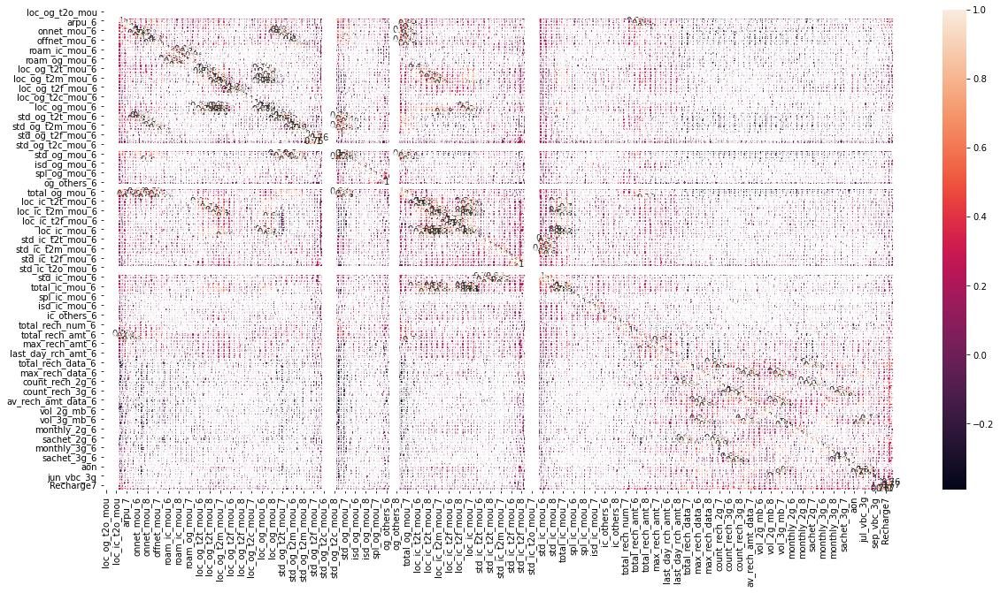

In [59]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(X_train.corr(),annot = True)
plt.show()

In [63]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38390
Model Family:                Binomial   Df Model:                          137
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 28 Feb 2021   Deviance:                          nan
Time:                        21:45:23   Pearson chi2:                 2.17e+19
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               6.487e+14   3.42e+05    1.9e+09      0.000    6.49e+14    6.49e+14
loc_og_t2o_mou        -0.0526   1.48e-08  -3.54e+06      0.000      -0.053      -0.053
std_og_t2o_mou        -4.9107   8.29e-09  -5.92e+08      0.000      -4.911      -4.911
loc_ic_t2o_mou        -6.9417   1.82e-08  -3.81e+08      0.000      -6.942      -6.942
arpu_6             -5.003e+13    1.3e+06  -3.86e+07      0.000      -5e+13      -5e+13
arpu_7              1.561e+14   1.32e+06   1.18e+08      0.000    1.56e+14    1.56e+14
arpu_8              2.232e+14   1.47e+06   1.52e+08      0.000    2.23e+14    2.23e+14
onnet_mou_6         1.156e+14   2.09e+06   5.52e+07      0.000    1.16e+14    1.16e+14
onnet_mou_7         1.055e+14   2.43e+06   4.34e+07      0.000    1.06e+14    1.06e+14
onnet_mou_8        -2.019e+14   2.06e+06   -9.8e+07      0.000   -2.02e+14   -2.02e+14
offnet_mou_6        5.533e+13   1.92e+06   2.88e+07      0.000    5.53e+13    5.53e+13
offnet_mou_7        2.056e+14   2.24e+06   9.17e+07      0.000    2.06e+14    2.06e+14
offnet_mou_8       -2.742e+14   1.79e+06  -1.53e+08      0.000   -2.74e+14   -2.74e+14
roam_ic_mou_6       2.723e+13   7.79e+05    3.5e+07      0.000    2.72e+13    2.72e+13
roam_ic_mou_7       2.201e+13   7.65e+05   2.88e+07      0.000     2.2e+13     2.2e+13
roam_ic_mou_8       3.366e+13   7.12e+05   4.73e+07      0.000    3.37e+13    3.37e+13
roam_og_mou_6      -5.741e+13   8.16e+05  -7.04e+07      0.000   -5.74e+13   -5.74e+13
roam_og_mou_7       -9.76e+13   7.81e+05  -1.25e+08      0.000   -9.76e+13   -9.76e+13
roam_og_mou_8       1.673e+14   7.26e+05   2.31e+08      0.000    1.67e+14    1.67e+14
loc_og_t2t_mou_6   -4.653e+12   1.19e+06  -3.91e+06      0.000   -4.65e+12   -4.65e+12
loc_og_t2t_mou_7    3.308e+13   1.28e+06   2.58e+07      0.000    3.31e+13    3.31e+13
loc_og_t2t_mou_8   -1.844e+14   1.22e+06  -1.51e+08      0.000   -1.84e+14   -1.84e+14
loc_og_t2m_mou_6    2.165e+13   1.91e+06   1.14e+07      0.000    2.17e+13    2.17e+13
loc_og_t2m_mou_7    6.923e+13   2.13e+06   3.25e+07      0.000    6.92e+13    6.92e+13
loc_og_t2m_mou_8   -2.808e+14   2.01e+06   -1.4e+08      0.000   -2.81e+14   -2.81e+14
loc_og_t2f_mou_6    3.882e+13    6.7e+05    5.8e+07      0.000    3.88e+13    3.88e+13
loc_og_t2f_mou_7    -3.56e+13   7.79e+05  -4.57e+07      0.000   -3.56e+13   -3.56e+13
loc_og_t2f_mou_8   -4.743e+13   5.45e+05   -8.7e+07      0.000   -4.74e+13   -4.74e+13
loc_og_t2c_mou_6   -4.937e+12   4.45e+05  -1.11e+07      0.000   -4.94e+12   -4.94e+12
loc_og_t2c_mou_7   -1.748e+13   4.76e+05  -3.67e+07      0.000   -1.75e+13   -1.75e+13
loc_og_t2c_mou_8     3.49e+13   4.41e+05   7.91e+07      0.000    3.49e+13    3.49e+13
loc_og_mou_6       -5.811e+13   2.64e+06   -2.2e+07      0.000   -5.81e+13   -5.81e+13
loc_og_mou_7       -1.497e+14   2.93e+

`Conclusion`: There are 150+ predictors and it is really tedious to understand the model. Hence let's use RFE and get the top 30 vaiables and make a model using that

#### Recurssive Feture Elimination

In [64]:
#Creating object of the class LogisticRegression
logreg = LogisticRegression()

In [65]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 30)             # running RFE with 13 variables as output
rfe = rfe.fit(X_train, y_train)

In [66]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('loc_og_t2o_mou', False, 122),
 ('std_og_t2o_mou', False, 121),
 ('loc_ic_t2o_mou', False, 120),
 ('arpu_6', False, 60),
 ('arpu_7', False, 18),
 ('arpu_8', False, 26),
 ('onnet_mou_6', False, 30),
 ('onnet_mou_7', False, 3),
 ('onnet_mou_8', False, 15),
 ('offnet_mou_6', False, 33),
 ('offnet_mou_7', False, 5),
 ('offnet_mou_8', False, 14),
 ('roam_ic_mou_6', False, 65),
 ('roam_ic_mou_7', False, 110),
 ('roam_ic_mou_8', False, 66),
 ('roam_og_mou_6', False, 64),
 ('roam_og_mou_7', False, 100),
 ('roam_og_mou_8', False, 13),
 ('loc_og_t2t_mou_6', False, 37),
 ('loc_og_t2t_mou_7', False, 70),
 ('loc_og_t2t_mou_8', False, 2),
 ('loc_og_t2m_mou_6', False, 38),
 ('loc_og_t2m_mou_7', False, 88),
 ('loc_og_t2m_mou_8', True, 1),
 ('loc_og_t2f_mou_6', False, 63),
 ('loc_og_t2f_mou_7', False, 74),
 ('loc_og_t2f_mou_8', False, 45),
 ('loc_og_t2c_mou_6', False, 94),
 ('loc_og_t2c_mou_7', False, 76),
 ('loc_og_t2c_mou_8', False, 68),
 ('loc_og_mou_6', False, 36),
 ('loc_og_mou_7', False, 7),
 (

In [67]:
col = X_train.columns[rfe.support_]

In [68]:
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_mou_8', 'total_ic_mou_8', 'last_day_rch_amt_8',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7',
       'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7',
       'count_rech_3g_8', 'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8',
       'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6',
       'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7',
       'sachet_3g_8', 'avgRecharge'],
      dtype='object')

In [69]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38500
Model Family:                Binomial   Df Model:                           27
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 28 Feb 2021   Deviance:                          nan
Time:                        21:50:17   Pearson chi2:                 1.85e+19
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               3.944e+14   3.42e+05   1.15e+09      0.000    3.94e+14    3.94e+14
loc_og_t2m_mou_8   -1.276e+14   8.54e+05  -1.49e+08      0.000   -1.28e+14   -1.28e+14
loc_og_mou_8        2.461e+14   1.36e+06   1.81e+08      0.000    2.46e+14    2.46e+14
std_og_mou_8        6.327e+14   1.57e+06   4.02e+08      0.000    6.33e+14    6.33e+14
total_og_mou_8     -8.664e+14   1.88e+06  -4.62e+08      0.000   -8.66e+14   -8.66e+14
loc_ic_mou_8        4.248e+14   9.46e+05   4.49e+08      0.000    4.25e+14    4.25e+14
total_ic_mou_8     -6.129e+14   9.13e+05  -6.71e+08      0.000   -6.13e+14   -6.13e+14
last_day_rch_amt_8 -1.228e+14   4.08e+05  -3.01e+08      0.000   -1.23e+14   -1.23e+14
total_rech_data_6   3.327e+15   1.66e+06      2e+09      0.000    3.33e+15    3.33e+15
total_rech_data_7   2.952e+15   1.87e+06   1.58e+09      0.000    2.95e+15    2.95e+15
total_rech_data_8   4.104e+15   1.92e+06   2.14e+09      0.000     4.1e+15     4.1e+15
max_rech_data_8    -2.079e+14   6.15e+05  -3.38e+08      0.000   -2.08e+14   -2.08e+14
count_rech_2g_6     3.512e+15    2.4e+06   1.46e+09      0.000    3.51e+15    3.51e+15
count_rech_2g_7     2.696e+15   2.75e+06    9.8e+08      0.000     2.7e+15     2.7e+15
count_rech_2g_8     4.175e+15   2.79e+06    1.5e+09      0.000    4.18e+15    4.18e+15
count_rech_3g_6     6.972e+14   2.17e+06   3.21e+08      0.000    6.97e+14    6.97e+14
count_rech_3g_7      1.47e+15   2.57e+06   5.71e+08      0.000    1.47e+15    1.47e+15
count_rech_3g_8     1.532e+15   3.16e+06   4.85e+08      0.000    1.53e+15    1.53e+15
monthly_2g_6       -1.025e+15   6.89e+05  -1.49e+09      0.000   -1.02e+15   -1.02e+15
monthly_2g_7       -8.392e+14   7.31e+05  -1.15e+09      0.000   -8.39e+14   -8.39e+14
monthly_2g_8       -1.041e+15   7.81e+05  -1.33e+09      0.000   -1.04e+15   -1.04e+15
sachet_2g_6        -6.479e+15   3.74e+06  -1.73e+09      0.000   -6.48e+15   -6.48e+15
sachet_2g_7        -5.373e+15   4.24e+06  -1.27e+09      0.000   -5.37e+15   -5.37e+15
sachet_2g_8        -7.506e+15   4.12e+06  -1.82e+09      0.000   -7.51e+15   -7.51e+15
monthly_3g_6       -1.066e+15   1.08e+06  -9.86e+08      0.000   -1.07e+15   -1.07e+15
monthly_3g_7       -1.313e+15   1.19e+06   -1.1e+09      0.000   -1.31e+15   -1.31e+15
monthly_3g_8       -1.448e+15   1.53e+06  -9.47e+08      0.000   -1.45e+15   -1.45e+15
sachet_3g_6        -1.826e+15   1.84e+06  -9.93e+08      0.000   -1.83e+15   -1.83e+15
sachet_3g_7        -2.431e+15   2.26e+06  -1.08e+09      0.000   -2.43e+15   -2.43e+15
sachet_3g_8        -2.846e+15   2.81e+06  -1.01e+09      0.000   -2.85e+15   -2.85e+15
avgRecharge         3.182e+14   4.79e+05   6.65e+08      0.000    3.18e+14    3.18e+14
======================================================================================
"""

In [70]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
15,count_rech_3g_7,inf
8,total_rech_data_7,inf
16,count_rech_3g_8,inf
14,count_rech_3g_6,inf
13,count_rech_2g_8,inf
12,count_rech_2g_7,inf
9,total_rech_data_8,inf
11,count_rech_2g_6,inf
7,total_rech_data_6,22245.33
21,sachet_2g_7,153.65


`Conclusion :` There are a lot of columns with high VIF Values. Let's start with dropping count_rech_3g_7 and then do modelling

In [71]:
#dropping the column
col = col.drop('count_rech_3g_7', 1)
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_mou_8', 'total_ic_mou_8', 'last_day_rch_amt_8',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7',
       'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_8', 'monthly_2g_6',
       'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7',
       'sachet_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8',
       'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'avgRecharge'],
      dtype='object')

In [72]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38500
Model Family:                Binomial   Df Model:                           27
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 28 Feb 2021   Deviance:                          nan
Time:                        21:50:35   Pearson chi2:                 2.64e+19
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                2.13e+14   3.42e+05   6.23e+08      0.000    2.13e+14    2.13e+14
loc_og_t2m_mou_8   -8.379e+13   8.54e+05  -9.81e+07      0.000   -8.38e+13   -8.38e+13
loc_og_mou_8         5.01e+14   1.36e+06   3.68e+08      0.000    5.01e+14    5.01e+14
std_og_mou_8        4.537e+14   1.57e+06   2.88e+08      0.000    4.54e+14    4.54e+14
total_og_mou_8     -1.119e+15   1.88e+06  -5.96e+08      0.000   -1.12e+15   -1.12e+15
loc_ic_mou_8        1.028e+14   9.46e+05   1.09e+08      0.000    1.03e+14    1.03e+14
total_ic_mou_8     -3.015e+14   9.13e+05   -3.3e+08      0.000   -3.01e+14   -3.01e+14
last_day_rch_amt_8 -1.884e+14   4.08e+05  -4.61e+08      0.000   -1.88e+14   -1.88e+14
total_rech_data_6   3.389e+15   1.66e+06   2.04e+09      0.000    3.39e+15    3.39e+15
total_rech_data_7   5.102e+15   5.88e+06   8.67e+08      0.000     5.1e+15     5.1e+15
total_rech_data_8   3.567e+15   1.92e+06   1.86e+09      0.000    3.57e+15    3.57e+15
max_rech_data_8     3.693e+13   6.15e+05      6e+07      0.000    3.69e+13    3.69e+13
count_rech_2g_6     3.216e+15    2.4e+06   1.34e+09      0.000    3.22e+15    3.22e+15
count_rech_2g_7     1.983e+14   7.21e+06   2.75e+07      0.000    1.98e+14    1.98e+14
count_rech_2g_8     3.795e+15   2.79e+06   1.36e+09      0.000     3.8e+15     3.8e+15
count_rech_3g_6     1.466e+15   2.17e+06   6.75e+08      0.000    1.47e+15    1.47e+15
count_rech_3g_8      1.01e+15   3.16e+06    3.2e+08      0.000    1.01e+15    1.01e+15
monthly_2g_6       -9.717e+14   6.89e+05  -1.41e+09      0.000   -9.72e+14   -9.72e+14
monthly_2g_7       -7.197e+14   7.31e+05  -9.85e+08      0.000    -7.2e+14    -7.2e+14
monthly_2g_8       -1.007e+15   7.81e+05  -1.29e+09      0.000   -1.01e+15   -1.01e+15
sachet_2g_6        -6.186e+15   3.74e+06  -1.65e+09      0.000   -6.19e+15   -6.19e+15
sachet_2g_7        -4.674e+15   4.24e+06   -1.1e+09      0.000   -4.67e+15   -4.67e+15
sachet_2g_8        -6.718e+15   4.12e+06  -1.63e+09      0.000   -6.72e+15   -6.72e+15
monthly_3g_6       -1.393e+15   1.08e+06  -1.29e+09      0.000   -1.39e+15   -1.39e+15
monthly_3g_7        -1.06e+15   1.19e+06  -8.88e+08      0.000   -1.06e+15   -1.06e+15
monthly_3g_8       -1.146e+15   1.53e+06  -7.49e+08      0.000   -1.15e+15   -1.15e+15
sachet_3g_6         -2.44e+15   1.84e+06  -1.33e+09      0.000   -2.44e+15   -2.44e+15
sachet_3g_7        -1.945e+15   2.26e+06   -8.6e+08      0.000   -1.94e+15   -1.94e+15
sachet_3g_8        -2.246e+15   2.81e+06  -7.99e+08      0.000   -2.25e+15   -2.25e+15
avgRecharge         2.535e+14   4.79e+05    5.3e+08      0.000    2.53e+14    2.53e+14
======================================================================================
"""

In [73]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
14,count_rech_3g_6,inf
9,total_rech_data_8,inf
15,count_rech_3g_8,inf
13,count_rech_2g_8,inf
11,count_rech_2g_6,inf
7,total_rech_data_6,2731617.90
12,count_rech_2g_7,444.75
8,total_rech_data_7,296.17
20,sachet_2g_7,153.65
21,sachet_2g_8,145.01


`Conclusion`: count_rech_3g_6 has extemely high VIF. Hence we take a decision to drop that columns

In [74]:
#dropping the column
col = col.drop('count_rech_3g_6', 1)
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_mou_8', 'total_ic_mou_8', 'last_day_rch_amt_8',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7',
       'count_rech_2g_8', 'count_rech_3g_8', 'monthly_2g_6', 'monthly_2g_7',
       'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8',
       'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6',
       'sachet_3g_7', 'sachet_3g_8', 'avgRecharge'],
      dtype='object')

In [75]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38500
Model Family:                Binomial   Df Model:                           27
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 28 Feb 2021   Deviance:                          nan
Time:                        21:50:52   Pearson chi2:                 1.48e+06
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               1.562e+04   1.53e+05      0.102      0.919   -2.84e+05    3.16e+05
loc_og_t2m_mou_8      -0.3968      0.072     -5.510      0.000      -0.538      -0.256
loc_og_mou_8           0.4703      0.104      4.502      0.000       0.266       0.675
std_og_mou_8           1.3903      0.154      9.050      0.000       1.089       1.691
total_og_mou_8        -2.1878      0.187    -11.723      0.000      -2.554      -1.822
loc_ic_mou_8           1.2839      0.100     12.893      0.000       1.089       1.479
total_ic_mou_8        -2.4525      0.108    -22.736      0.000      -2.664      -2.241
last_day_rch_amt_8    -0.5535      0.026    -21.367      0.000      -0.604      -0.503
total_rech_data_6   1.096e+05   4.88e+06      0.022      0.982   -9.46e+06    9.68e+06
total_rech_data_7   3.399e+04   5.78e+06      0.006      0.995   -1.13e+07    1.14e+07
total_rech_data_8   2.477e+04   1.83e+06      0.014      0.989   -3.56e+06    3.61e+06
max_rech_data_8       -0.7341      0.060    -12.271      0.000      -0.851      -0.617
count_rech_2g_6    -6.185e+04   5.99e+06     -0.010      0.992   -1.18e+07    1.17e+07
count_rech_2g_7     2.046e+05   7.06e+06      0.029      0.977   -1.36e+07     1.4e+07
count_rech_2g_8    -6794.9281   2.72e+06     -0.002      0.998   -5.34e+06    5.32e+06
count_rech_3g_8     7.115e+04   3.01e+06      0.024      0.981   -5.82e+06    5.96e+06
monthly_2g_6       -4668.1693   4.73e+05     -0.010      0.992   -9.32e+05    9.23e+05
monthly_2g_7       -3.203e+04   5.56e+05     -0.058      0.954   -1.12e+06    1.06e+06
monthly_2g_8       -2077.3693   6.16e+05     -0.003      0.997   -1.21e+06     1.2e+06
sachet_2g_6         -3.22e+04   3.27e+06     -0.010      0.992   -6.43e+06    6.37e+06
sachet_2g_7        -2.294e+05   3.98e+06     -0.058      0.954   -8.03e+06    7.57e+06
sachet_2g_8        -1.348e+04   3.99e+06     -0.003      0.997   -7.84e+06    7.81e+06
monthly_3g_6       -2.066e+04   9.21e+05     -0.022      0.982   -1.83e+06    1.78e+06
monthly_3g_7       -6227.6088   1.06e+06     -0.006      0.995   -2.08e+06    2.07e+06
monthly_3g_8       -3.801e+04   1.44e+06     -0.026      0.979   -2.86e+06    2.78e+06
sachet_3g_6        -3.746e+04   1.67e+06     -0.022      0.982   -3.31e+06    3.24e+06
sachet_3g_7        -1.239e+04   2.11e+06     -0.006      0.995   -4.14e+06    4.12e+06
sachet_3g_8        -6.937e+04   2.63e+06     -0.026      0.979   -5.22e+06    5.08e+06
avgRecharge            0.8544      0.035     24.730      0.000       0.787       0.922
======================================================================================
"""

In [76]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
14,count_rech_3g_8,inf
13,count_rech_2g_8,inf
9,total_rech_data_8,inf
12,count_rech_2g_7,444.75
11,count_rech_2g_6,343.11
8,total_rech_data_7,296.17
7,total_rech_data_6,221.81
19,sachet_2g_7,153.65
20,sachet_2g_8,145.01
18,sachet_2g_6,119.57


`Conclusion: `count_rech_3g_8 has high p value and VIF values. Hence we take a decision to droop it

In [77]:
#dropping the column
col = col.drop('count_rech_3g_8', 1)
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_mou_8', 'total_ic_mou_8', 'last_day_rch_amt_8',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7',
       'count_rech_2g_8', 'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8',
       'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6',
       'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7',
       'sachet_3g_8', 'avgRecharge'],
      dtype='object')

In [78]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38500
Model Family:                Binomial   Df Model:                           27
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 28 Feb 2021   Deviance:                          nan
Time:                        21:51:12   Pearson chi2:                 1.48e+06
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               1.468e+04   1.52e+05      0.097      0.923   -2.83e+05    3.12e+05
loc_og_t2m_mou_8      -0.3968      0.072     -5.509      0.000      -0.538      -0.256
loc_og_mou_8           0.4703      0.104      4.502      0.000       0.266       0.675
std_og_mou_8           1.3903      0.154      9.049      0.000       1.089       1.691
total_og_mou_8        -2.1878      0.187    -11.721      0.000      -2.554      -1.822
loc_ic_mou_8           1.2839      0.100     12.892      0.000       1.089       1.479
total_ic_mou_8        -2.4525      0.108    -22.735      0.000      -2.664      -2.241
last_day_rch_amt_8    -0.5535      0.026    -21.365      0.000      -0.604      -0.503
total_rech_data_6   9.297e+04   4.71e+06      0.020      0.984   -9.14e+06    9.33e+06
total_rech_data_7   1.274e+04   5.12e+06      0.002      0.998      -1e+07       1e+07
total_rech_data_8   2.069e+05   7.14e+06      0.029      0.977   -1.38e+07    1.42e+07
max_rech_data_8       -0.7341      0.060    -12.271      0.000      -0.851      -0.617
count_rech_2g_6    -4.711e+04   5.89e+06     -0.008      0.994   -1.16e+07    1.15e+07
count_rech_2g_7     2.181e+05   6.49e+06      0.034      0.973   -1.25e+07    1.29e+07
count_rech_2g_8    -1.609e+05   7.13e+06     -0.023      0.982   -1.41e+07    1.38e+07
monthly_2g_6       -4723.1845   4.79e+05     -0.010      0.992   -9.43e+05    9.33e+05
monthly_2g_7       -3.136e+04   5.45e+05     -0.058      0.954    -1.1e+06    1.04e+06
monthly_2g_8       -1534.6229   5.04e+05     -0.003      0.998    -9.9e+05    9.87e+05
sachet_2g_6        -3.258e+04    3.3e+06     -0.010      0.992    -6.5e+06    6.44e+06
sachet_2g_7        -2.246e+05    3.9e+06     -0.058      0.954   -7.87e+06    7.42e+06
sachet_2g_8        -9956.4271   3.27e+06     -0.003      0.998   -6.42e+06     6.4e+06
monthly_3g_6       -1.753e+04   8.88e+05     -0.020      0.984   -1.76e+06    1.72e+06
monthly_3g_7       -2334.8108   9.38e+05     -0.002      0.998   -1.84e+06    1.84e+06
monthly_3g_8       -4.108e+04   1.42e+06     -0.029      0.977   -2.82e+06    2.74e+06
sachet_3g_6        -3.179e+04   1.61e+06     -0.020      0.984   -3.19e+06    3.13e+06
sachet_3g_7        -4643.1264   1.87e+06     -0.002      0.998   -3.66e+06    3.65e+06
sachet_3g_8        -7.498e+04   2.59e+06     -0.029      0.977   -5.15e+06       5e+06
avgRecharge            0.8544      0.035     24.728      0.000       0.787       0.922
======================================================================================
"""

In [79]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
13,count_rech_2g_8,548.10
9,total_rech_data_8,507.71
12,count_rech_2g_7,444.75
11,count_rech_2g_6,343.11
8,total_rech_data_7,296.17
7,total_rech_data_6,221.88
18,sachet_2g_7,153.65
19,sachet_2g_8,145.01
17,sachet_2g_6,119.57
25,sachet_3g_8,67.54


`Conclusion:` count_rech_2g_8 has a high VIF and high p-value, Hence we take a decision to drop that column.

In [80]:
#dropping the column
col = col.drop('count_rech_2g_8', 1)
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_mou_8', 'total_ic_mou_8', 'last_day_rch_amt_8',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7', 'monthly_2g_6',
       'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7',
       'sachet_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8',
       'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'avgRecharge'],
      dtype='object')

In [81]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38501
Model Family:                Binomial   Df Model:                           26
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 28 Feb 2021   Deviance:                          nan
Time:                        21:51:27   Pearson chi2:                 1.48e+06
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               1.716e+04   1.52e+05      0.113      0.910   -2.82e+05    3.16e+05
loc_og_t2m_mou_8      -0.3968      0.072     -5.509      0.000      -0.538      -0.256
loc_og_mou_8           0.4703      0.104      4.502      0.000       0.266       0.675
std_og_mou_8           1.3903      0.154      9.049      0.000       1.089       1.691
total_og_mou_8        -2.1878      0.187    -11.721      0.000      -2.554      -1.822
loc_ic_mou_8           1.2839      0.100     12.892      0.000       1.089       1.479
total_ic_mou_8        -2.4525      0.108    -22.735      0.000      -2.664      -2.241
last_day_rch_amt_8    -0.5535      0.026    -21.365      0.000      -0.604      -0.503
total_rech_data_6   9.201e+04   4.72e+06      0.020      0.984   -9.15e+06    9.34e+06
total_rech_data_7   2.282e+05   5.58e+06      0.041      0.967   -1.07e+07    1.12e+07
total_rech_data_8   1.769e+04   3.74e+06      0.005      0.996   -7.31e+06    7.34e+06
max_rech_data_8       -0.7341      0.060    -12.271      0.000      -0.851      -0.617
count_rech_2g_6     -4.65e+04   5.86e+06     -0.008      0.994   -1.15e+07    1.14e+07
count_rech_2g_7     3.117e+04   6.77e+06      0.005      0.996   -1.32e+07    1.33e+07
monthly_2g_6       -4691.4880   4.75e+05     -0.010      0.992   -9.36e+05    9.27e+05
monthly_2g_7       -3.115e+04   5.46e+05     -0.057      0.955    -1.1e+06    1.04e+06
monthly_2g_8       -2220.7688   4.69e+05     -0.005      0.996   -9.22e+05    9.17e+05
sachet_2g_6        -3.236e+04   3.28e+06     -0.010      0.992   -6.46e+06    6.39e+06
sachet_2g_7        -2.231e+05   3.91e+06     -0.057      0.955   -7.89e+06    7.44e+06
sachet_2g_8        -1.441e+04   3.04e+06     -0.005      0.996   -5.98e+06    5.95e+06
monthly_3g_6       -1.735e+04    8.9e+05     -0.020      0.984   -1.76e+06    1.73e+06
monthly_3g_7       -4.181e+04   1.02e+06     -0.041      0.967   -2.05e+06    1.96e+06
monthly_3g_8       -3512.3571   7.42e+05     -0.005      0.996   -1.46e+06    1.45e+06
sachet_3g_6        -3.146e+04   1.61e+06     -0.020      0.984   -3.19e+06    3.13e+06
sachet_3g_7        -8.315e+04   2.03e+06     -0.041      0.967   -4.07e+06     3.9e+06
sachet_3g_8        -6411.0385   1.35e+06     -0.005      0.996   -2.66e+06    2.65e+06
avgRecharge            0.8544      0.035     24.728      0.000       0.787       0.922
======================================================================================
"""

In [82]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,count_rech_2g_7,428.36
11,count_rech_2g_6,339.66
8,total_rech_data_7,286.73
7,total_rech_data_6,220.44
17,sachet_2g_7,152.07
9,total_rech_data_8,136.30
16,sachet_2g_6,118.96
18,sachet_2g_8,91.46
23,sachet_3g_7,42.72
3,total_og_mou_8,30.12


`Conclusion:` count_rech_2g_7 has a high p value and high VIF value. So we take the decision to drop it.

In [83]:
#dropping the column
col = col.drop('count_rech_2g_7', 1)
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_mou_8', 'total_ic_mou_8', 'last_day_rch_amt_8',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'max_rech_data_8', 'count_rech_2g_6', 'monthly_2g_6', 'monthly_2g_7',
       'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8',
       'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6',
       'sachet_3g_7', 'sachet_3g_8', 'avgRecharge'],
      dtype='object')

In [84]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38502
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 28 Feb 2021   Deviance:                          nan
Time:                        21:51:43   Pearson chi2:                 1.48e+06
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               1.717e+04   1.51e+05      0.114      0.910   -2.79e+05    3.14e+05
loc_og_t2m_mou_8      -0.3968      0.072     -5.509      0.000      -0.538      -0.256
loc_og_mou_8           0.4703      0.104      4.502      0.000       0.266       0.675
std_og_mou_8           1.3903      0.154      9.049      0.000       1.089       1.691
total_og_mou_8        -2.1878      0.187    -11.721      0.000      -2.554      -1.822
loc_ic_mou_8           1.2839      0.100     12.892      0.000       1.089       1.479
total_ic_mou_8        -2.4525      0.108    -22.735      0.000      -2.664      -2.241
last_day_rch_amt_8    -0.5535      0.026    -21.365      0.000      -0.604      -0.503
total_rech_data_6   9.139e+04   4.56e+06      0.020      0.984   -8.85e+06    9.04e+06
total_rech_data_7   2.548e+05   3.16e+06      0.081      0.936   -5.95e+06    6.46e+06
total_rech_data_8   1.206e+04   3.21e+06      0.004      0.997   -6.27e+06     6.3e+06
max_rech_data_8       -0.7341      0.060    -12.271      0.000      -0.851      -0.617
count_rech_2g_6    -4.599e+04   5.55e+06     -0.008      0.993   -1.09e+07    1.08e+07
monthly_2g_6       -4689.3360   4.59e+05     -0.010      0.992   -9.04e+05    8.95e+05
monthly_2g_7       -3.002e+04   3.73e+05     -0.081      0.936   -7.61e+05    7.01e+05
monthly_2g_8       -1514.6029   4.03e+05     -0.004      0.997   -7.91e+05    7.88e+05
sachet_2g_6        -3.235e+04   3.17e+06     -0.010      0.992   -6.24e+06    6.17e+06
sachet_2g_7         -2.15e+05   2.67e+06     -0.081      0.936   -5.45e+06    5.02e+06
sachet_2g_8        -9826.5404   2.61e+06     -0.004      0.997   -5.13e+06    5.11e+06
monthly_3g_6       -1.724e+04   8.61e+05     -0.020      0.984    -1.7e+06    1.67e+06
monthly_3g_7       -4.669e+04    5.8e+05     -0.081      0.936   -1.18e+06    1.09e+06
monthly_3g_8       -2395.3900   6.37e+05     -0.004      0.997   -1.25e+06    1.25e+06
sachet_3g_6        -3.125e+04   1.56e+06     -0.020      0.984   -3.09e+06    3.03e+06
sachet_3g_7        -9.286e+04   1.15e+06     -0.081      0.936   -2.35e+06    2.17e+06
sachet_3g_8        -4372.4218   1.16e+06     -0.004      0.997   -2.28e+06    2.27e+06
avgRecharge            0.8544      0.035     24.728      0.000       0.787       0.922
======================================================================================
"""

In [85]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,count_rech_2g_6,306.73
7,total_rech_data_6,207.04
9,total_rech_data_8,136.22
15,sachet_2g_6,113.15
8,total_rech_data_7,98.81
17,sachet_2g_8,91.38
16,sachet_2g_7,75.37
3,total_og_mou_8,30.12
21,sachet_3g_6,27.25
2,std_og_mou_8,21.22


`Conclusion:` count_rech_2g_6 has a high p value and high VIF value. So we take the decision to drop it.

In [86]:
#dropping the column
col = col.drop('count_rech_2g_6', 1)
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_mou_8', 'total_ic_mou_8', 'last_day_rch_amt_8',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'max_rech_data_8', 'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8',
       'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6',
       'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7',
       'sachet_3g_8', 'avgRecharge'],
      dtype='object')

In [87]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38503
Model Family:                Binomial   Df Model:                           24
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 28 Feb 2021   Deviance:                          nan
Time:                        21:51:57   Pearson chi2:                 1.48e+06
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               1.874e+04   1.51e+05      0.124      0.901   -2.78e+05    3.16e+05
loc_og_t2m_mou_8      -0.3968      0.072     -5.509      0.000      -0.538      -0.256
loc_og_mou_8           0.4703      0.104      4.502      0.000       0.266       0.675
std_og_mou_8           1.3903      0.154      9.049      0.000       1.089       1.691
total_og_mou_8        -2.1878      0.187    -11.721      0.000      -2.554      -1.822
loc_ic_mou_8           1.2839      0.100     12.892      0.000       1.089       1.479
total_ic_mou_8        -2.4525      0.108    -22.735      0.000      -2.664      -2.241
last_day_rch_amt_8    -0.5535      0.026    -21.365      0.000      -0.604      -0.503
total_rech_data_6    8.52e+04   2.65e+06      0.032      0.974   -5.11e+06    5.28e+06
total_rech_data_7   2.535e+05   3.17e+06      0.080      0.936   -5.96e+06    6.47e+06
total_rech_data_8   1.201e+04   3.17e+06      0.004      0.997    -6.2e+06    6.22e+06
max_rech_data_8       -0.7341      0.060    -12.271      0.000      -0.851      -0.617
monthly_2g_6       -1.045e+04   3.25e+05     -0.032      0.974   -6.48e+05    6.27e+05
monthly_2g_7       -2.987e+04   3.73e+05     -0.080      0.936   -7.62e+05    7.02e+05
monthly_2g_8       -1508.2395   3.98e+05     -0.004      0.997   -7.81e+05    7.78e+05
sachet_2g_6        -7.207e+04   2.24e+06     -0.032      0.974   -4.47e+06    4.32e+06
sachet_2g_7        -2.139e+05   2.67e+06     -0.080      0.936   -5.46e+06    5.03e+06
sachet_2g_8        -9785.2554   2.58e+06     -0.004      0.997   -5.07e+06    5.05e+06
monthly_3g_6       -1.607e+04      5e+05     -0.032      0.974   -9.96e+05    9.64e+05
monthly_3g_7       -4.645e+04   5.81e+05     -0.080      0.936   -1.18e+06    1.09e+06
monthly_3g_8       -2385.3248   6.29e+05     -0.004      0.997   -1.24e+06    1.23e+06
sachet_3g_6        -2.913e+04   9.07e+05     -0.032      0.974   -1.81e+06    1.75e+06
sachet_3g_7        -9.238e+04   1.16e+06     -0.080      0.936   -2.36e+06    2.17e+06
sachet_3g_8        -4354.0514   1.15e+06     -0.004      0.997   -2.26e+06    2.25e+06
avgRecharge            0.8544      0.035     24.728      0.000       0.787       0.922
======================================================================================
"""

In [88]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,total_rech_data_8,136.05
8,total_rech_data_7,98.81
16,sachet_2g_8,91.22
15,sachet_2g_7,75.35
7,total_rech_data_6,75.07
14,sachet_2g_6,57.64
3,total_og_mou_8,30.11
2,std_og_mou_8,21.21
22,sachet_3g_8,19.38
21,sachet_3g_7,16.65


`Conclusion:` total_rech_data_8 has high p value and high VIF.Hence we take the decision to drop it

In [89]:
#dropping the column
col = col.drop('total_rech_data_8', 1)
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_mou_8', 'total_ic_mou_8', 'last_day_rch_amt_8',
       'total_rech_data_6', 'total_rech_data_7', 'max_rech_data_8',
       'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_6',
       'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6', 'monthly_3g_7',
       'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8',
       'avgRecharge'],
      dtype='object')

In [90]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38504
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 28 Feb 2021   Deviance:                          nan
Time:                        21:52:09   Pearson chi2:                 1.53e+06
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               1.835e+04   1.49e+05      0.123      0.902   -2.74e+05    3.11e+05
loc_og_t2m_mou_8      -0.3177      0.068     -4.701      0.000      -0.450      -0.185
loc_og_mou_8           0.4125      0.098      4.231      0.000       0.221       0.604
std_og_mou_8           1.4057      0.143      9.862      0.000       1.126       1.685
total_og_mou_8        -2.1646      0.173    -12.510      0.000      -2.504      -1.825
loc_ic_mou_8           1.2153      0.092     13.181      0.000       1.035       1.396
total_ic_mou_8        -2.3119      0.099    -23.242      0.000      -2.507      -2.117
last_day_rch_amt_8    -0.5170      0.024    -21.846      0.000      -0.563      -0.471
total_rech_data_6   8.511e+04   2.63e+06      0.032      0.974   -5.06e+06    5.23e+06
total_rech_data_7   2.531e+05   3.03e+06      0.084      0.933   -5.68e+06    6.19e+06
max_rech_data_8       -0.1527      0.053     -2.884      0.004      -0.256      -0.049
monthly_2g_6       -1.044e+04   3.22e+05     -0.032      0.974   -6.42e+05    6.21e+05
monthly_2g_7       -2.982e+04   3.57e+05     -0.084      0.933   -7.29e+05     6.7e+05
monthly_2g_8          -0.4472      0.057     -7.900      0.000      -0.558      -0.336
sachet_2g_6          -7.2e+04   2.22e+06     -0.032      0.974   -4.43e+06    4.28e+06
sachet_2g_7        -2.136e+05   2.56e+06     -0.084      0.933   -5.22e+06     4.8e+06
sachet_2g_8           -0.9879      0.068    -14.622      0.000      -1.120      -0.855
monthly_3g_6       -1.605e+04   4.95e+05     -0.032      0.974   -9.87e+05    9.55e+05
monthly_3g_7       -4.637e+04   5.55e+05     -0.084      0.933   -1.13e+06    1.04e+06
monthly_3g_8          -0.3929      0.065     -6.065      0.000      -0.520      -0.266
sachet_3g_6         -2.91e+04   8.98e+05     -0.032      0.974   -1.79e+06    1.73e+06
sachet_3g_7        -9.224e+04    1.1e+06     -0.084      0.933   -2.26e+06    2.07e+06
sachet_3g_8           -0.6275      0.093     -6.728      0.000      -0.810      -0.445
avgRecharge            0.8272      0.032     25.648      0.000       0.764       0.890
======================================================================================
"""

In [91]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,total_rech_data_7,90.60
7,total_rech_data_6,73.31
14,sachet_2g_7,70.06
13,sachet_2g_6,56.32
3,total_og_mou_8,30.10
2,std_og_mou_8,21.21
1,loc_og_mou_8,15.85
20,sachet_3g_7,15.70
19,sachet_3g_6,11.12
4,loc_ic_mou_8,7.62


`Conclusion:` total_rech_data_7 has high p value and high VIF.Hence we take the decision to drop it

In [92]:
#dropping the column
col = col.drop('total_rech_data_7', 1)
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_mou_8', 'total_ic_mou_8', 'last_day_rch_amt_8',
       'total_rech_data_6', 'max_rech_data_8', 'monthly_2g_6', 'monthly_2g_7',
       'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8',
       'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6',
       'sachet_3g_7', 'sachet_3g_8', 'avgRecharge'],
      dtype='object')

In [93]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38505
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 28 Feb 2021   Deviance:                          nan
Time:                        21:52:22   Pearson chi2:                 2.13e+06
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               1.242e+04   1.37e+05      0.090      0.928   -2.57e+05    2.82e+05
loc_og_t2m_mou_8      -0.2560      0.062     -4.101      0.000      -0.378      -0.134
loc_og_mou_8           0.4882      0.093      5.244      0.000       0.306       0.671
std_og_mou_8           1.5468      0.138     11.239      0.000       1.277       1.817
total_og_mou_8        -2.4095      0.167    -14.385      0.000      -2.738      -2.081
loc_ic_mou_8           0.7822      0.079      9.849      0.000       0.627       0.938
total_ic_mou_8        -1.8345      0.083    -22.046      0.000      -1.998      -1.671
last_day_rch_amt_8    -0.5263      0.022    -24.103      0.000      -0.569      -0.483
total_rech_data_6   1.974e+05   2.18e+06      0.090      0.928   -4.08e+06    4.48e+06
max_rech_data_8        0.0371      0.045      0.819      0.413      -0.052       0.126
monthly_2g_6       -2.421e+04   2.68e+05     -0.090      0.928   -5.49e+05    5.01e+05
monthly_2g_7          -0.4845      0.032    -15.098      0.000      -0.547      -0.422
monthly_2g_8          -0.5854      0.051    -11.380      0.000      -0.686      -0.485
sachet_2g_6         -1.67e+05   1.85e+06     -0.090      0.928   -3.79e+06    3.45e+06
sachet_2g_7           -0.4698      0.039    -12.119      0.000      -0.546      -0.394
sachet_2g_8           -1.0567      0.059    -18.047      0.000      -1.172      -0.942
monthly_3g_6       -3.724e+04   4.12e+05     -0.090      0.928   -8.44e+05     7.7e+05
monthly_3g_7          -0.3408      0.030    -11.259      0.000      -0.400      -0.281
monthly_3g_8          -0.5871      0.059    -10.012      0.000      -0.702      -0.472
sachet_3g_6         -6.75e+04   7.47e+05     -0.090      0.928   -1.53e+06     1.4e+06
sachet_3g_7           -0.2186      0.052     -4.173      0.000      -0.321      -0.116
sachet_3g_8           -0.7592      0.088     -8.621      0.000      -0.932      -0.587
avgRecharge            0.8492      0.030     28.288      0.000       0.790       0.908
======================================================================================
"""

In [94]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,total_rech_data_6,58.76
12,sachet_2g_6,45.49
3,total_og_mou_8,30.10
2,std_og_mou_8,21.21
1,loc_og_mou_8,15.85
18,sachet_3g_6,9.22
4,loc_ic_mou_8,7.61
5,total_ic_mou_8,7.12
0,loc_og_t2m_mou_8,6.24
15,monthly_3g_6,3.81


`Conclusion:` total_rech_data_6 has high p value and high VIF.Hence we take the decision to drop it

In [95]:
#dropping the column
col = col.drop('total_rech_data_6', 1)
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_mou_8', 'total_ic_mou_8', 'last_day_rch_amt_8',
       'max_rech_data_8', 'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8',
       'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6',
       'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7',
       'sachet_3g_8', 'avgRecharge'],
      dtype='object')

In [96]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38506
Model Family:                Binomial   Df Model:                           21
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14228.
Date:                Sun, 28 Feb 2021   Deviance:                       28457.
Time:                        21:52:33   Pearson chi2:                 4.07e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.4630      0.019    -24.408      0.000      -0.500      -0.426
loc_og_t2m_mou_8      -0.4003      0.045     -8.928      0.000      -0.488      -0.312
loc_og_mou_8           0.7078      0.076      9.295      0.000       0.559       0.857
std_og_mou_8           1.4939      0.117     12.780      0.000       1.265       1.723
total_og_mou_8        -2.4330      0.142    -17.103      0.000      -2.712      -2.154
loc_ic_mou_8           0.7773      0.061     12.682      0.000       0.657       0.897
total_ic_mou_8        -1.6670      0.064    -25.963      0.000      -1.793      -1.541
last_day_rch_amt_8    -0.5315      0.019    -28.365      0.000      -0.568      -0.495
max_rech_data_8        0.1021      0.033      3.098      0.002       0.038       0.167
monthly_2g_6          -0.4052      0.022    -18.161      0.000      -0.449      -0.361
monthly_2g_7          -0.4435      0.025    -17.731      0.000      -0.493      -0.394
monthly_2g_8          -0.7334      0.041    -17.892      0.000      -0.814      -0.653
sachet_2g_6           -0.3836      0.023    -16.904      0.000      -0.428      -0.339
sachet_2g_7           -0.2584      0.026    -10.036      0.000      -0.309      -0.208
sachet_2g_8           -0.9475      0.032    -29.263      0.000      -1.011      -0.884
monthly_3g_6          -0.3029      0.023    -13.095      0.000      -0.348      -0.258
monthly_3g_7          -0.3407      0.026    -13.337      0.000      -0.391      -0.291
monthly_3g_8          -0.7005      0.044    -15.993      0.000      -0.786      -0.615
sachet_3g_6           -0.2459      0.026     -9.393      0.000      -0.297      -0.195
sachet_3g_7            0.0629      0.029      2.200      0.028       0.007       0.119
sachet_3g_8           -0.4332      0.036    -12.083      0.000      -0.503      -0.363
avgRecharge            0.9670      0.024     39.859      0.000       0.919       1.015
======================================================================================
"""

In [97]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,total_og_mou_8,29.98
2,std_og_mou_8,21.18
1,loc_og_mou_8,15.82
4,loc_ic_mou_8,7.58
5,total_ic_mou_8,7.06
0,loc_og_t2m_mou_8,6.24
7,max_rech_data_8,2.95
18,sachet_3g_7,2.80
12,sachet_2g_7,2.63
16,monthly_3g_8,2.56


`Conclusion: `total_og_mou_8 which has high p-value hence we drop it

In [98]:
#dropping the column
col = col.drop('total_og_mou_8', 1)
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'loc_ic_mou_8',
       'total_ic_mou_8', 'last_day_rch_amt_8', 'max_rech_data_8',
       'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_6',
       'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6', 'monthly_3g_7',
       'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8',
       'avgRecharge'],
      dtype='object')

In [99]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38507
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14408.
Date:                Sun, 28 Feb 2021   Deviance:                       28816.
Time:                        21:52:38   Pearson chi2:                 4.71e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.4541      0.019    -24.155      0.000      -0.491      -0.417
loc_og_t2m_mou_8      -0.2975      0.042     -7.120      0.000      -0.379      -0.216
loc_og_mou_8          -0.4371      0.042    -10.404      0.000      -0.519      -0.355
std_og_mou_8          -0.5063      0.015    -32.692      0.000      -0.537      -0.476
loc_ic_mou_8           1.0314      0.061     16.928      0.000       0.912       1.151
total_ic_mou_8        -1.9568      0.064    -30.511      0.000      -2.082      -1.831
last_day_rch_amt_8    -0.5523      0.019    -29.574      0.000      -0.589      -0.516
max_rech_data_8        0.1045      0.033      3.177      0.001       0.040       0.169
monthly_2g_6          -0.4015      0.022    -18.185      0.000      -0.445      -0.358
monthly_2g_7          -0.4484      0.025    -17.995      0.000      -0.497      -0.400
monthly_2g_8          -0.7430      0.041    -18.179      0.000      -0.823      -0.663
sachet_2g_6           -0.3670      0.022    -16.352      0.000      -0.411      -0.323
sachet_2g_7           -0.2533      0.026     -9.902      0.000      -0.303      -0.203
sachet_2g_8           -0.9610      0.032    -29.745      0.000      -1.024      -0.898
monthly_3g_6          -0.2806      0.023    -12.264      0.000      -0.325      -0.236
monthly_3g_7          -0.3335      0.025    -13.194      0.000      -0.383      -0.284
monthly_3g_8          -0.7031      0.044    -16.091      0.000      -0.789      -0.617
sachet_3g_6           -0.2381      0.026     -9.174      0.000      -0.289      -0.187
sachet_3g_7            0.0693      0.028      2.433      0.015       0.013       0.125
sachet_3g_8           -0.4430      0.036    -12.343      0.000      -0.513      -0.373
avgRecharge            0.9189      0.024     38.592      0.000       0.872       0.966
======================================================================================
"""

In [100]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,loc_ic_mou_8,7.47
4,total_ic_mou_8,6.95
1,loc_og_mou_8,6.53
0,loc_og_t2m_mou_8,6.06
6,max_rech_data_8,2.95
17,sachet_3g_7,2.80
11,sachet_2g_7,2.63
15,monthly_3g_8,2.55
16,sachet_3g_6,2.22
9,monthly_2g_8,2.13


`Conclusion: `loc_ic_mou_8 which has high p-value hence we drop it

In [101]:
#dropping the column
col = col.drop('loc_ic_mou_8', 1)
col

Index(['loc_og_t2m_mou_8', 'loc_og_mou_8', 'std_og_mou_8', 'total_ic_mou_8',
       'last_day_rch_amt_8', 'max_rech_data_8', 'monthly_2g_6', 'monthly_2g_7',
       'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8',
       'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6',
       'sachet_3g_7', 'sachet_3g_8', 'avgRecharge'],
      dtype='object')

In [102]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38508
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14565.
Date:                Sun, 28 Feb 2021   Deviance:                       29129.
Time:                        21:52:44   Pearson chi2:                 6.98e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.4710      0.019    -24.906      0.000      -0.508      -0.434
loc_og_t2m_mou_8      -0.2556      0.041     -6.171      0.000      -0.337      -0.174
loc_og_mou_8          -0.3351      0.041     -8.128      0.000      -0.416      -0.254
std_og_mou_8          -0.5695      0.015    -37.648      0.000      -0.599      -0.540
total_ic_mou_8        -1.0635      0.030    -35.456      0.000      -1.122      -1.005
last_day_rch_amt_8    -0.5807      0.019    -31.278      0.000      -0.617      -0.544
max_rech_data_8        0.1027      0.033      3.132      0.002       0.038       0.167
monthly_2g_6          -0.3888      0.022    -17.826      0.000      -0.432      -0.346
monthly_2g_7          -0.4606      0.025    -18.497      0.000      -0.509      -0.412
monthly_2g_8          -0.7544      0.041    -18.446      0.000      -0.835      -0.674
sachet_2g_6           -0.3299      0.022    -14.951      0.000      -0.373      -0.287
sachet_2g_7           -0.2482      0.025     -9.750      0.000      -0.298      -0.198
sachet_2g_8           -1.0041      0.033    -30.857      0.000      -1.068      -0.940
monthly_3g_6          -0.2393      0.022    -10.751      0.000      -0.283      -0.196
monthly_3g_7          -0.3283      0.025    -13.173      0.000      -0.377      -0.279
monthly_3g_8          -0.7087      0.044    -16.247      0.000      -0.794      -0.623
sachet_3g_6           -0.2268      0.026     -8.853      0.000      -0.277      -0.177
sachet_3g_7            0.0683      0.028      2.412      0.016       0.013       0.124
sachet_3g_8           -0.4481      0.036    -12.436      0.000      -0.519      -0.377
avgRecharge            0.8854      0.024     37.639      0.000       0.839       0.932
======================================================================================
"""

In [103]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,loc_og_mou_8,6.37
0,loc_og_t2m_mou_8,6.05
5,max_rech_data_8,2.95
16,sachet_3g_7,2.80
10,sachet_2g_7,2.63
14,monthly_3g_8,2.55
15,sachet_3g_6,2.21
8,monthly_2g_8,2.13
13,monthly_3g_7,2.07
9,sachet_2g_6,2.07


`Conclusion:`loc_og_mou_8 has a high p-value, Hence we take the decision to drop it.

In [104]:
#dropping the column
col = col.drop('loc_og_mou_8', 1)
col

Index(['loc_og_t2m_mou_8', 'std_og_mou_8', 'total_ic_mou_8',
       'last_day_rch_amt_8', 'max_rech_data_8', 'monthly_2g_6', 'monthly_2g_7',
       'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8',
       'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6',
       'sachet_3g_7', 'sachet_3g_8', 'avgRecharge'],
      dtype='object')

In [105]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38509
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14600.
Date:                Sun, 28 Feb 2021   Deviance:                       29200.
Time:                        21:52:51   Pearson chi2:                 6.46e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.4768      0.019    -25.211      0.000      -0.514      -0.440
loc_og_t2m_mou_8      -0.5258      0.025    -21.328      0.000      -0.574      -0.477
std_og_mou_8          -0.5595      0.015    -37.201      0.000      -0.589      -0.530
total_ic_mou_8        -1.1221      0.029    -38.113      0.000      -1.180      -1.064
last_day_rch_amt_8    -0.5870      0.019    -31.693      0.000      -0.623      -0.551
max_rech_data_8        0.1067      0.033      3.253      0.001       0.042       0.171
monthly_2g_6          -0.3873      0.022    -17.767      0.000      -0.430      -0.345
monthly_2g_7          -0.4555      0.025    -18.312      0.000      -0.504      -0.407
monthly_2g_8          -0.7553      0.041    -18.482      0.000      -0.835      -0.675
sachet_2g_6           -0.3236      0.022    -14.678      0.000      -0.367      -0.280
sachet_2g_7           -0.2423      0.025     -9.534      0.000      -0.292      -0.193
sachet_2g_8           -1.0046      0.033    -30.829      0.000      -1.069      -0.941
monthly_3g_6          -0.2350      0.022    -10.559      0.000      -0.279      -0.191
monthly_3g_7          -0.3229      0.025    -12.946      0.000      -0.372      -0.274
monthly_3g_8          -0.7092      0.044    -16.255      0.000      -0.795      -0.624
sachet_3g_6           -0.2271      0.026     -8.870      0.000      -0.277      -0.177
sachet_3g_7            0.0739      0.028      2.608      0.009       0.018       0.129
sachet_3g_8           -0.4464      0.036    -12.362      0.000      -0.517      -0.376
avgRecharge            0.8731      0.023     37.315      0.000       0.827       0.919
======================================================================================
"""

In [106]:
#Checking for VIF values
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,max_rech_data_8,2.95
15,sachet_3g_7,2.80
9,sachet_2g_7,2.63
13,monthly_3g_8,2.55
14,sachet_3g_6,2.21
7,monthly_2g_8,2.13
8,sachet_2g_6,2.07
12,monthly_3g_7,2.07
2,total_ic_mou_8,1.90
10,sachet_2g_8,1.87


`Conclusion:` The VIF and P values of all the columns are in the permisible limit. Hence we go ahead with this model

#### Model Evaluation and Prediction

In [107]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [108]:
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['CustID'] = y_train.index
y_train_pred_final.head()

,Churn,Churn_Prob,CustID
0,1,0.897140,33036
1,0,0.175255,2428
2,0,0.326783,23076
3,0,0.949528,5204
4,0,0.238821,24830


In [109]:
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,1,0.897140,33036,1
1,0,0.175255,2428,0
2,0,0.326783,23076,0
3,0,0.949528,5204,1
4,0,0.238821,24830,0


In [110]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print(confusion)

[[15705  3585]
 [ 2598 16640]]


In [111]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8395193106312292


In [112]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [113]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8649547770038466

In [114]:
# Let us calculate specificity
TN / float(TN+FP)

0.8141524105754276

Getting AUC of ROC curve

In [115]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [116]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False )

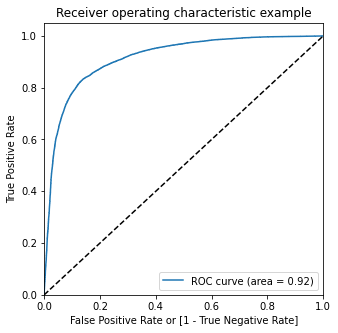

In [117]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

`Concusion:` The AUC is 0.92 which is pretty good. and the graph is also away from the 45 degree line

In [118]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.897140,33036,1,1,1,1,1,1,1,1,1,1,0
1,0,0.175255,2428,0,1,1,0,0,0,0,0,0,0,0
2,0,0.326783,23076,0,1,1,1,1,0,0,0,0,0,0
3,0,0.949528,5204,1,1,1,1,1,1,1,1,1,1,1
4,0,0.238821,24830,0,1,1,1,0,0,0,0,0,0,0


In [119]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.499325  1.000000  0.000000
0.1   0.1  0.723059  0.975049  0.471747
0.2   0.2  0.774086  0.953945  0.594712
0.3   0.3  0.805674  0.929099  0.682582
0.4   0.4  0.825478  0.898482  0.752670
0.5   0.5  0.839519  0.864955  0.814152
0.6   0.6  0.846942  0.826593  0.867237
0.7   0.7  0.836145  0.762449  0.909642
0.8   0.8  0.796304  0.643882  0.948315
0.9   0.9  0.625571  0.264373  0.985796


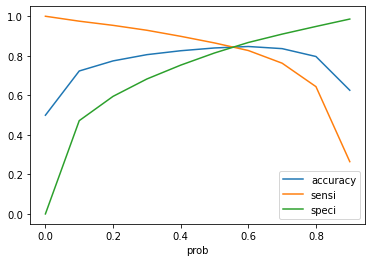

In [120]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

`Conclusion:` From the above curve, we can conclude that 0.5 is our optimum probability cut-off

In [121]:
#Precision on training set .
precision_score(y_train_pred_final.Churn, y_train_pred_final.predicted)

0.8227441285537701

In [122]:
#Recall on training set
recall_score(y_train_pred_final.Churn, y_train_pred_final.predicted)

0.8649547770038466

#### Making predicitons on test data

In [123]:
X_test_scale=scaler.transform(X_test.values)
X_test= pd.DataFrame(X_test_scale, columns=X_test.columns, index=X_test.index)

In [124]:
X_test_log=X_test[col]
X_test.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Recharge6,Recharge7,avgRecharge
32009,0.0,0.0,0.0,1.424533,-1.606931,-1.005753,-0.628055,-0.631393,-0.494304,-0.268269,-0.728032,-0.539147,1.329400,-0.425482,-0.257909,0.639989,-0.461077,-0.292617,-0.616635,-0.531482,-0.437300,-0.667436,-0.568840,-0.458045,-0.241289,-0.241082,-0.237790,-0.221924,-0.203436,-0.212592,-0.710861,-0.578569,-0.465276,-0.553046,-0.541985,-0.417558,-0.496785,-0.578684,-0.451434,-0.141116,-0.129846,-0.114278,0.0,0.0,0.0,-0.672446,-0.695282,-0.512414,3.086528,-0.285718,-0.233545,-0.606310,-0.641865,-0.507815,-0.498079,0.0,0.0,-0.760312,-0.975987,-0.727810,-0.674332,-0.502771,-0.420935,-0.326460,-0.473150,-0.390664,-0.064760,-0.068480,-0.401727,-0.477291,-0.444722,-0.392855,-0.581602,0.159265,-0.432526,0.543740,0.302481,-0.445588,0.716996,0.729880,-0.305724,0.0,0.0,0.0,0.194129,0.382017,-0.440051,-0.012161,-0.665237,-0.714548,-0.248522,0.047843,-0.154752,2.820360,-0.386616,-0.316887,0.622303,0.692383,-0.314308,-0.374520,-1.228445,-0.907654,1.050524,-1.523692,-0.932423,0.642812,-1.350618,-0.916224,0.474148,-1.025899,-0.616572,-0.571947,-0.547379,-0.435535,-0.736693,-0.700586,-0.565353,-0.486511,-0.473139,-0.389192,-0.364594,-0.326229,-0.266828,-0.760496,-0.728026,-0.570985,-0.502282,-0.474342,-0.373560,-0.508794,-0.485606,-0.418749,-0.302277,-0.300106,-0.273766,-0.408676,-0.402258,-0.325977,-0.318861,-0.29964,-0.263384,-0.193406,-0.181918,-0.145791,0.560154,-0.402269,-0.449615,-0.461398,0.069801,-1.284697,-0.797999
38581,0.0,0.0,0.0,-0.114834,0.464302,-0.039976,-0.427805,-0.360346,-0.541215,1.577675,2.494498,1.622997,-0.395063,-0.425482,-0.440680,-0.407231,-0.461077,-0.464235,-0.676791,-0.617999,-0.554619,-0.774110,-0.641062,-0.659446,-0.243405,-0.241082,-0.237790,-0.145875,-0.203436,-0.184821,-0.800862,-0.694074,-0.679883,-0.206519,-0.154404,-0.364050,2.531075,2.8

In [125]:
y_test_pred = res.predict(sm.add_constant(X_test_log))

In [126]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)
# Putting CustID to index
y_test_df['CustID'] = y_test_df.index

# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

y_pred_final.head()

,Target,CustID,Churn_Prob
0,1,32009,0.873162
1,1,38581,0.696052
2,1,12733,0.894467
3,1,35625,0.893543
4,1,16133,0.910024


In [193]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_pred_final.head()

,Target,CustID,Churn_Prob,final_predicted
0,1,32009,0.873162,1
1,1,38581,0.696052,1
2,1,12733,0.894467,1
3,1,35625,0.893543,1
4,1,16133,0.910024,1


In [129]:
# Let's check the overall accuracy.
acc=metrics.accuracy_score(y_pred_final.Target, y_pred_final.final_predicted)
acc

0.8381782945736435

In [130]:
pre=precision_score(y_pred_final.Target, y_pred_final.final_predicted)
pre

0.8212322491983509

In [131]:
rec=recall_score(y_pred_final.Target, y_pred_final.final_predicted)
rec

0.8658536585365854

In [135]:
models=pd.DataFrame({"model":["Logistic Regression"], "accuracy":[acc], "precision":[pre], "recall":[rec]  })

In [136]:
models

,model,accuracy,precision,recall
0,Logistic Regression,0.838178,0.821232,0.865854


<a id="DT"></a>
>### DECISION TREE

In [195]:
# Viewing the shape of train data and test data
print(X_train.shape)
print(X_test.shape)

(38528, 151)
(16512, 151)


In [210]:
# Creating a function which will print the graph of decision tree
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X.columns, 
                    class_names=['Churn', "No Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [163]:
# Creating a function which will print Accuracy, precision and recall on train and test data 
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Sensitivity:",recall_score(y_train, dt_classifier.predict(X_train)))
    print("Train Precision:",precision_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Sensitivity:",recall_score(y_test, dt_classifier.predict(X_test)))
    print("Test Precision:",precision_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))

**Creating a trial model of Decision tree with max_depth=3**

In [214]:
# Creating instance of the class
dt = DecisionTreeClassifier(max_depth=3)
#Fitting the model
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

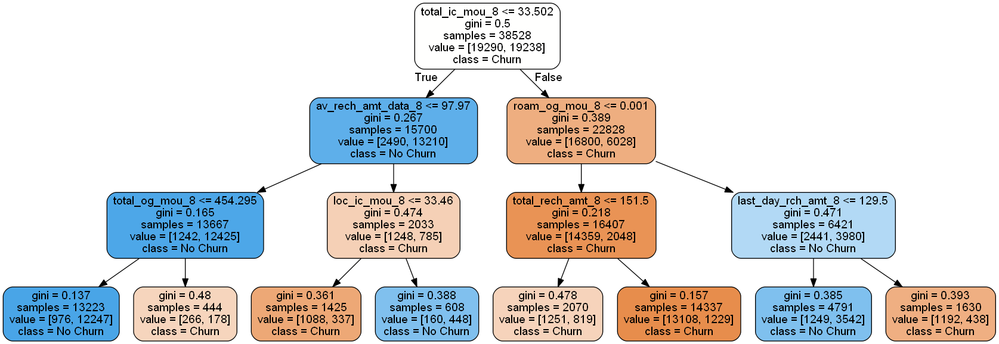

In [215]:
#Viewing the model
gph = get_dt_graph(dt)
Image(gph.create_png())

**Creating a default decision tree**

In [176]:
#Instantiating the object of class DecisionTreeClassifier
dt_default = DecisionTreeClassifier(random_state=42)

#Fitting the model
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [177]:
#Viewing the default Decision tree
gph = get_dt_graph(dt_default)
Image(gph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.377761 to fit



In [181]:
#Evaluating the model
evaluate_model(dt_default)

Train Accuracy : 1.0
Train Confusion Matrix:
[[19290     0]
 [    0 19238]]
--------------------------------------------------
Test Accuracy : 0.9212693798449613
Test Confusion Matrix:
[[7489  741]
 [ 559 7723]]


`Conclusion:` The default model is overfitting the model. Hence we'll tune the hyperparameters

#### HYPERPARAMETER TUNING

In [141]:
#Instantiating the object of the class DecisionTreeClassifier
dt=DecisionTreeClassifier(random_state=42)

In [185]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [5, 10, 15, 20, 30],
    'min_samples_leaf': [5, 10, 20, 50, 100, 200, 500, 1000, 2000,3000],
    'criterion': ["gini", "entropy"]
}

In [186]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [187]:
#Fitting grid search model
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 100 candidates, totalling 400 fits
Wall time: 10min 29s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 15, 20, 30],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200, 500,
                                              1000, 2000, 3000]},
             scoring='accuracy', verbose=1)

In [188]:
#Viewing results of grid_search
score_df = pd.DataFrame(grid_search.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,2.270013,0.019129,0.039050,0.007811,gini,5,5,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.877180,0.879153,0.878530,0.885071,0.879983,0.003022,47
1,2.050817,0.019130,0.042956,0.006766,gini,5,10,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.877076,0.879360,0.878426,0.884967,0.879957,0.003004,48
2,2.082934,0.036630,0.062479,0.019131,gini,5,20,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.877284,0.879360,0.878426,0.884967,0.880009,0.002955,46
3,2.561679,0.064401,0.054668,0.007810,gini,5,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.877803,0.878945,0.878426,0.884967,0.880035,0.002876,45
4,3.379441,0.033135,0.054669,0.007810,gini,5,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.877284,0.877803,0.877492,0.884967,0.879386,0.003227,49


In [189]:
# The best model after performing grid search
grid_search.best_estimator_

DecisionTreeClassifier(max_depth=15, min_samples_leaf=5, random_state=42)

**Performing Grid Search again**
 with new parameter set

In [193]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [5, 7 ,10, 15, 20, 25],
    'min_samples_leaf': [5,7 ,10, 15 ,20, 25 ,50],
    'criterion': ["gini", "entropy"]
}

In [194]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [195]:
# Fitting grid search model
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 84 candidates, totalling 336 fits
Wall time: 11min 16s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 7, 10, 15, 20, 25],
                         'min_samples_leaf': [5, 7, 10, 15, 20, 25, 50]},
             scoring='accuracy', verbose=1)

In [196]:
#Best Model after performing grid search 
grid_search.best_estimator_

DecisionTreeClassifier(max_depth=15, min_samples_leaf=5, random_state=42)

**Performing Grid Search again** with new set of parameters

In [139]:
params = {
    'max_depth': [4,5,6,7],
    'min_samples_leaf': [11,12,13,14,15,16,17,18],
    'criterion': ["gini", "entropy"]
}

In [142]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [143]:
# Fitting the grid search model
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 64 candidates, totalling 256 fits
Wall time: 6min 57s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7],
                         'min_samples_leaf': [11, 12, 13, 14, 15, 16, 17, 18]},
             scoring='accuracy', verbose=1)

In [144]:
#Finding the best model
dt_best=grid_search.best_estimator_

In [145]:
dt_best

DecisionTreeClassifier(max_depth=7, min_samples_leaf=12, random_state=42)

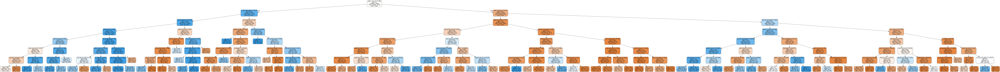

In [212]:
#Visualising the model
gph = get_dt_graph(dt_best)
Image(gph.create_png())

In [208]:
#Evaluating the model
evaluate_model(dt_best)

Train Accuracy : 0.9101432724252492
Train Sensitivity: 0.9024846657656721
Train Precision: 0.9162972345366266
Train Confusion Matrix:
[[17704  1586]
 [ 1876 17362]]
--------------------------------------------------
Test Accuracy : 0.8991036821705426
Test Sensitivity: 0.8915720840376721
Test Precision: 0.9057899901864573
Test Confusion Matrix:
[[7462  768]
 [ 898 7384]]


`Conclusion: `Let's accept this model, as there isn't much difference in accuracy on test and train data. 
Hence the dt_best is our accepted with the following parameters:
- max_depth =7
- min_sample_leaf= 12

**Making predictions on the test data**

In [198]:
y_pred_final['DecisionTreePredictions']= dt_best.predict(X_test)
y_pred_final.head()

,Target,CustID,Churn_Prob,final_predicted,DecisionTreePredictions
0,1,32009,0.873162,1,1
1,1,38581,0.696052,1,0
2,1,12733,0.894467,1,1
3,1,35625,0.893543,1,1
4,1,16133,0.910024,1,1


Creating the dataframe of model and it's matrices

In [146]:
acc= accuracy_score(y_test, dt_best.predict(X_test))
rec= recall_score(y_test, dt_best.predict(X_test))
pre= precision_score(y_test, dt_best.predict(X_test))

In [148]:
df2=pd.DataFrame({"model":["Decision Tree"], "accuracy":[acc], "precision":[pre], "recall":[rec]  })

In [149]:
models = models.append(df2, ignore_index = True) 

In [150]:
models.head()

,model,accuracy,precision,recall
0,Logistic Regression,0.838178,0.821232,0.865854
1,Decision Tree,0.899528,0.907068,0.890968


<a id="RF"></a>
>### RANDOM FOREST

In [156]:
#Creating instance of the Randmoforest class
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [157]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [1, 2, 5, 10, 20,25],
    'min_samples_leaf': [5,10, 50, 100, 200, 300, 500, 1000],
    'max_features': [2,3,4,5],
    'n_estimators': [10, 30, 50, 100, 200]
}

In [158]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=classifier_rf, param_grid=params, 
                          cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [159]:
# Fitting the grid search model
%%time
grid_search.fit(X_train,y_train)

Fitting 4 folds for each of 960 candidates, totalling 3840 fits
Wall time: 1h 38min 5s


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [1, 2, 5, 10, 20, 25],
                         'max_features': [2, 3, 4, 5],
                         'min_samples_leaf': [5, 10, 50, 100, 200, 300, 500,
                                              1000],
                         'n_estimators': [10, 30, 50, 100, 200]},
             scoring='accuracy', verbose=1)

In [160]:
# Finding the best model from grid search
rf_best = grid_search.best_estimator_

In [161]:
rf_best

RandomForestClassifier(max_depth=25, max_features=5, min_samples_leaf=5,
                       n_estimators=200, n_jobs=-1, random_state=42)

In [164]:
# Evaluating the best model from grid search
evaluate_model(rf_best)

Train Accuracy : 0.9826360049833887
Train Sensitivity: 0.9873687493502443
Train Precision: 0.9780649812059111
Train Confusion Matrix:
[[18864   426]
 [  243 18995]]
--------------------------------------------------
Test Accuracy : 0.9530038759689923
Test Sensitivity: 0.9531514127022458
Test Precision: 0.9531514127022458
Test Confusion Matrix:
[[7842  388]
 [ 388 7894]]


`Cocnlusion:` The model above has high train accuracy over test accuracy.Hence we need a new model.


Since the Cross Validation with Random forest is taking a lot of time, we'll manually try to tweak the data to get the best results, here after


**Rerunning Random Forest**

In [167]:
#Creating instance of the Randmoforest class
try_rf = RandomForestClassifier(random_state=42, n_jobs=-1, max_depth=30,max_features=7,min_samples_leaf=5,n_estimators=200)

In [169]:
#Fitting random_forest
try_rf.fit(X_train,y_train)

RandomForestClassifier(max_depth=30, max_features=7, min_samples_leaf=5,
                       n_estimators=200, n_jobs=-1, random_state=42)

In [170]:
#Evaluating the model
evaluate_model(try_rf)

Train Accuracy : 0.9834146594684385
Train Sensitivity: 0.9880444952697786
Train Precision: 0.9789359839316063
Train Confusion Matrix:
[[18881   409]
 [  230 19008]]
--------------------------------------------------
Test Accuracy : 0.9547601744186046
Test Sensitivity: 0.9573774450615793
Test Precision: 0.9526613000120149
Test Confusion Matrix:
[[7836  394]
 [ 353 7929]]


`Conclusion:` The test accuracy is less than train accuracy, hence we need a new model cause this model is overfiting.

**Creating new Random Forest Model**

In [171]:
#Creating instance of the Randmoforest class
try2_rf = RandomForestClassifier(random_state=42, n_jobs=-1, max_depth=45,max_features=8,min_samples_leaf=7,n_estimators=200)

In [172]:
#Fitting the model
try2_rf.fit(X_train,y_train)

RandomForestClassifier(max_depth=45, max_features=8, min_samples_leaf=7,
                       n_estimators=200, n_jobs=-1, random_state=42)

In [173]:
#Evaluating the model
evaluate_model(try2_rf)

Train Accuracy : 0.9767960963455149
Train Sensitivity: 0.9812350556190872
Train Precision: 0.9725399278722308
Train Confusion Matrix:
[[18757   533]
 [  361 18877]]
--------------------------------------------------
Test Accuracy : 0.9499152131782945
Test Sensitivity: 0.9512195121951219
Test Precision: 0.9490422840621612
Test Confusion Matrix:
[[7807  423]
 [ 404 7878]]


`Conclusion: `There is still dfference between the test accuracy and train accuracy. Implying the model is overfitting. Hence we need a new model

**Creating a new Random Forest Model**

In [200]:
#Creating instance of the Randmoforest class
try3_rf = RandomForestClassifier(random_state=42, n_jobs=-1, max_depth=15,max_features=15,min_samples_leaf=15,n_estimators=200)

In [201]:
try3_rf.fit(X_train,y_train)

RandomForestClassifier(max_depth=15, max_features=15, min_samples_leaf=15,
                       n_estimators=200, n_jobs=-1, random_state=42)

In [202]:
evaluate_model(try3_rf)

Train Accuracy : 0.9600550249169435
Train Sensitivity: 0.9613265412205011
Train Precision: 0.9587847996267302
Train Confusion Matrix:
[[18495   795]
 [  744 18494]]
--------------------------------------------------
Test Accuracy : 0.9413759689922481
Test Sensitivity: 0.9411977783144168
Test Precision: 0.9418801353310778
Test Confusion Matrix:
[[7749  481]
 [ 487 7795]]


`Conclusion:` There isn't much differece between train accuracy and test accuracy. As well as, the precision and recall are more or less same for both the dataset. Hence we take this as our final best model.

Therefore our bes random forest model has the following parameters:
- max_depth = 15
- max_feature = 15
- min_sample_leaf = 15
- n_estimators = 200

**Making Predicitons on test data**

In [205]:
y_pred_final['RandomForestPrediction']= try3_rf.predict(X_test)
y_pred_final.head()

,Target,CustID,Churn_Prob,final_predicted,DecisionTreePredictions,RandomForestPrediction
0,1,32009,0.873162,1,1,1
1,1,38581,0.696052,1,0,0
2,1,12733,0.894467,1,1,1
3,1,35625,0.893543,1,1,1
4,1,16133,0.910024,1,1,1


In [179]:
# Precision, Recall and accuracy 
acc= accuracy_score(y_test, try3_rf.predict(X_test))
rec= recall_score(y_test, try3_rf.predict(X_test))
pre= precision_score(y_test,try3_rf.predict(X_test))

In [180]:
df3=pd.DataFrame({"model":["Random Forest"], "accuracy":[acc], "precision":[pre], "recall":[rec]  })

In [181]:
models = models.append(df3, ignore_index = True) 
models

,model,accuracy,precision,recall
0,Logistic Regression,0.838178,0.821232,0.865854
1,Decision Tree,0.899528,0.907068,0.890968
2,Random Forest,0.941376,0.941880,0.941198


<a id="DTPCA"></a>
> ### DECISION TREE WITH PCA

In [208]:
#Instantiating object of PCA class.
pca=PCA(random_state= 45)

In [209]:
#Fitting PCA on X_train
pca.fit(X_train)

PCA(random_state=45)

In [210]:
#Viewing the components of PCA
pca.components_

array([[-2.40164108e-19,  1.11022302e-16, -2.22044605e-16, ...,
         9.18974651e-03,  4.35514837e-02,  2.93828496e-02],
       [-4.42756601e-19,  2.22044605e-16, -0.00000000e+00, ...,
         6.84582107e-02,  8.81275721e-02,  1.01323189e-01],
       [-1.48205350e-19,  1.66533454e-16, -7.97972799e-17, ...,
         9.47417053e-02,  1.98857217e-01,  1.84281233e-01],
       ...,
       [ 0.00000000e+00, -1.04192958e-02,  1.37369111e-02, ...,
        -3.59141970e-17,  6.76000055e-17, -4.08608694e-17],
       [ 9.99998282e-01, -1.58935553e-03,  3.91751149e-04, ...,
         5.01443505e-19, -6.77626358e-19,  4.20128342e-19],
       [-0.00000000e+00, -2.00712781e-02, -4.26896119e-01, ...,
        -3.46511014e-16, -3.19189120e-16,  1.11022302e-16]])

In [211]:
# Vaieing the explained variance of each components 
pca.explained_variance_ratio_

array([1.34193956e-01, 1.10152433e-01, 6.44107023e-02, 5.57347825e-02,
       3.85676028e-02, 3.68134103e-02, 2.99155984e-02, 2.79807498e-02,
       2.41876278e-02, 2.33372443e-02, 2.07043381e-02, 1.93415572e-02,
       1.79067246e-02, 1.67584293e-02, 1.55641323e-02, 1.51885188e-02,
       1.38799353e-02, 1.28353974e-02, 1.20926326e-02, 1.18675629e-02,
       1.08738352e-02, 1.03590501e-02, 9.83885207e-03, 9.58505313e-03,
       9.16699153e-03, 8.83277093e-03, 7.82355912e-03, 7.66326264e-03,
       7.38574977e-03, 7.36447020e-03, 6.90465334e-03, 6.63923011e-03,
       6.51690983e-03, 6.51418323e-03, 6.26691499e-03, 6.05916200e-03,
       5.89157848e-03, 5.72252970e-03, 5.36098263e-03, 5.24336006e-03,
       4.98444901e-03, 4.79108080e-03, 4.63541277e-03, 4.52538179e-03,
       4.27950464e-03, 4.22509446e-03, 4.12612821e-03, 4.07457331e-03,
       3.92259747e-03, 3.80427494e-03, 3.73110217e-03, 3.67997160e-03,
       3.55108375e-03, 3.52063179e-03, 3.43750564e-03, 3.41659060e-03,
      

<BarContainer object of 151 artists>

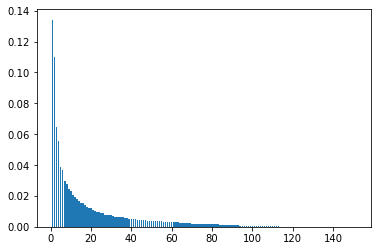

In [212]:
#Visualising the graph of variance and components
plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)

In [213]:
#Calculating cumulative sum of explained variance
var_cumu = np.cumsum(pca.explained_variance_ratio_)

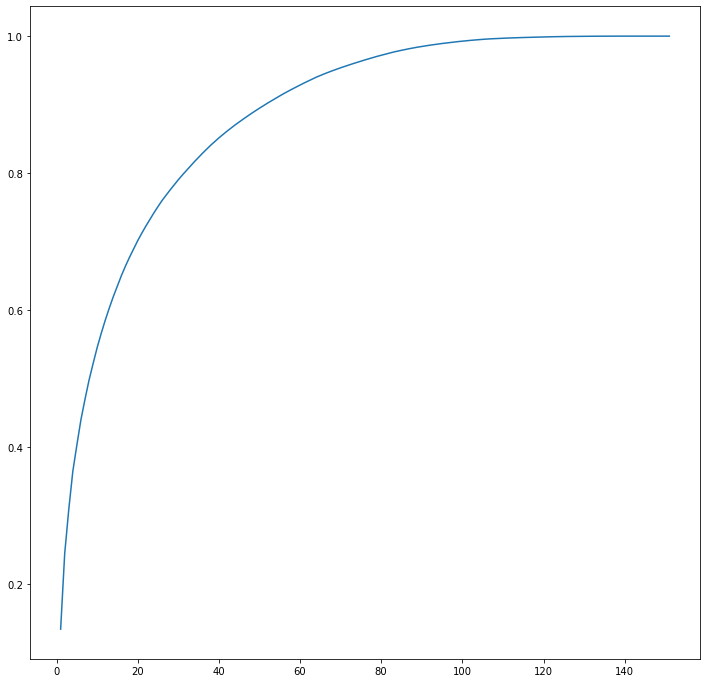

In [215]:
#Plotting the cumulative sum of components
plt.figure(figsize=[12,12])
plt.plot(range(1,len(var_cumu)+1), var_cumu)

Creating only 70 components using PCA

In [216]:
pc2=PCA(n_components=70,random_state=42)

In [220]:
#Fitting PCA on training data and creating new data set
X_train_pca=pc2.fit_transform(X_train)

In [222]:
#Viewing the shape of data after pca
X_train_pca.shape

(38528, 70)

In [225]:
#Creating dataframe after performing PCA
X_train_pca=pd.DataFrame(X_train_pca)
X_train_pca.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69
0,-2.974214,-4.500807,-0.880954,-0.844102,1.825144,0.183873,1.417814,-1.023041,-0.523137,-0.587148,-0.419807,0.903792,0.179998,-1.749017,-0.243086,-0.190985,0.385582,0.958543,0.498841,0.133253,0.220971,-0.655013,-0.001742,0.931423,-0.213809,1.159589,1.041939,1.115368,-0.433420,1.003206,-0.692750,0.161618,-0.379868,-0.721342,0.261346,-0.279967,0.077564,0.037882,-0.813198,-0.706307,0.113416,-0.231197,-1.587462,0.339266,0.556083,0.802281,0.014877,-0.089430,-0.328754,0.261250,0.508055,-0.140653,-0.054894,0.082193,-0.055747,-0.608417,-0.263610,0.211578,0.011790,0.157917,-0.059600,0.129732,0.282135,-0.368415,0.049853,0.016895,-0.358880,0.271241,-0.266431,0.508627
1,4.585369,-7.579619,9.139698,0.258389,-3.965031,-0.382346,-5.519102,2.485884,1.162538,-0.792898,0.080112,-0.722581,-0.501429,1.863976,-1.170851,-1.101225,0.213251,-2.866798,1.037413,-4.100072,0.485136,1.932988,-2.858272,0.310570,1.033809,-0.192427,-0.442913,-2.826919,0.474193,1.484903,-0.080902,-1.295547,1.765348,0.000505,1.695559,0.866284,1.367828,0.556535,0.221974,0.970043,0.016946,-0.952398,-0.619271,0.466874,-0.597067,-0.490768,-0.647983,0.834454,0.263222,-0.386983,0.230303,-2.038992,1.872325,-0.280410,0.595285,-0.302497,0.749788,0.279069,-0.050747,-0.205879,0.665052,0.671445,-0.751639,0.569555,-0.927544,0.716805,-0.542598,0.510603,1.063694,0.944869
2,1.634576,-1.894599,-1.400698,1.600080,-0.716822,-2.562360,2.084300,-0.976828,0.918971,-1.456785,0.222762,-1.050497,-0.930528,-0.121484,0.575583,0.043932,-0.059505,-0.809298,0.414884,-1.580601,-0.036052,0.178681,-0.656450,-0.351374,0.178852,-0.152747,0.569421,0.113474,0.236155,0.800854,0.571273,-0.450777,0.014456,-0.149443,0.018207,0.173471,-0.070997,0.332438,-0.238639,0.102941,-0.248533,-0.131930,1.035800,-0.151200,-0.072734,-0.098067,-0.010571,0.339102,0.134816,-0.041921,0.172168,0.041124,0.093251,0.185735,-0.144232,0.069067,-0.411796,-0.353646,0.482133,0.041171,0.044193,-0.314258,0.281258,0.443955,-0.181125,0.345704,-0.225002,-0.156919,0.298678,0.080978
3,-0.403847,-4.650039,-0.015367,-0.964142,3.923382,0.290128,-0.148268,4.743000,-1.059687,1.660533,-2.822315,0.172024,0.579054,-0.737392,-0.546552,-0.051469,1.484453,-0.644081,1.138190,-0.775993,0.475904,0.124006,0.506205,0.153369,1.892842,0.675351,1.229222,1.306088,0.070754,1.795261,0.713818,-0.097117,-2.149499,-0.352837,0.208237,-1.147163,0.084314,0.715040,-0.299364,-2.165261,-0.167877,0.142341,0.585085,-0.202234,-0.456331,0.018451,0.653053,0.624321,-1.301165,-0.437351,0.455249,-0.297752,0.701898,1.191149,1.353063,-0.795493,-2.745371,-0.412874,-0.519496,0.485020,-0.971458,-0.538911,0.953448,0.084761,0.360641,-1.236960,0.438190,-0.553339,-1.049115,-0.928524
4,0.759625,-2.528663,-0.199246,-3.253250,-0.157623,-3.262209,2.756048,0.247890,-0.343368,0.957214,2.399527,0.655972,-1.569008,-1.347502,0.565888,0.409225,-2.200247,-1.341108,-0.790916,3.317440,-1.087987,-1.009423,1.761137,0.192978,0.398651,0.558239,-1.210860,-0.552409,-0.187655,-0.665648,-0.237372,0.230406,0.235778,0.354229,-0.281872,0.150530,0.604623,0.598613,-1.378459,1.209099,0.307879,-0.140000,-0.335418,0.273796,-0.156222,0.242619,0.112370,0.440427,-0.179583,-0.280942,0.311644,-1.086850,0.373074,0.103357,1.039225,0.040944,0.531625,0.571696,0.730690,-1.047645,1.056396,0.403440,-0.086714,-0.459710,0.254318,-0.395247,0.374377,-0.034653,0.172872,-0.280751


In [226]:
# Making transformation on test data
X_test_pca =pd.DataFrame(pc2.transform(X_test))
#Viewing the test data
X_test_pca.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69
0,-3.120181,-1.150481,-3.554407,-1.174160,0.121366,2.332030,0.111689,0.149133,1.026347,0.771739,1.428452,-1.624375,0.837644,-0.961205,0.190775,-0.375230,-0.037628,-0.123835,-0.514764,0.319232,-0.727001,0.020407,-1.686750,0.820647,0.015643,0.251088,0.199871,-1.518530,1.296432,-0.519433,0.263300,-0.156622,0.799224,0.652332,-1.348341,0.253620,-1.170865,-0.311893,0.408027,-0.306026,-1.977065,0.085324,-0.105848,-0.702211,0.194839,-0.296929,0.008023,0.058364,0.143160,0.593586,0.455081,-0.007924,-0.783036,-0.129217,-1.400194,-0.327001,1.354349,-0.612697,-0.189086,-0.396187,0.075583,-0.412540,0.284775,0.164341,-0.404579,0.015479,0.126506,-0.163407,-0.559115,-0.414873
1,-0.732702,-5.545791,2.453961,-0.540396,-0.587903,0.190759,3.440375,-4.253463,0.031222,-1.249567,0.606683,0.259244,-0.592899,-0.263718,-0.193962,0.169199,-0.269125,1.245624,-0.574103,-0.305641,0.033710,0.454778,-0.461000,-0.141846,0.085649,0.170023,-0.279775,-0.038257,-0.356281,-0.291673,0.310274,0.030949,0.028276,-0.342362,-0.099414,-0.117707,-0.090137,0.219672,-0.064423,-0.613553,-0.163365,-0.672190,0.709281,-0.176082,0.509613,-0.008923,-0.295376,0.274452,0.105700,-0.369074,0.272600,-0.469591,0.270283,0.246009,-0.308122,-0.053220,-0.192022,0.154705,-0.170374,-0.446304,0.268573,0.431305,-0.169594,0.507602,-0.039062,0.119056,0.032048,-0.247123,0.137511,-0.282917
2,-3.820244,-3.740526,-1.126815,0.158595,1.304227,-0.239285,1.414115,-2.151717,0.292650,0.189587,-0.473815,0.082538,0.284049,-1.468588,-0.028262,-0.243235,0.710082,0.577735,0.452668,-1.160139,0.234479,-0.337525,-1.165204,-0.032011,-0.736078,0.582749,0.235159,-0.183459,0.081764,1.518057,-0.278561,-0.109331,0.474008,0.246185,0.057644,-0.116195,0.548536,0.503276,0.014532,0.397334,-0.643918,-0.510331,-0.987785,0.985139,-0.038390,0.274273,-0.364573,0.270907,0.293775,-0.092540,0.294602,-0.482903,0.612369,0.168184,0.637175,0.384384,-0.054275,0.130188,-0.008304,-0.163288,0.307807,-0.146652,0.221977,-0.042322,0.072281,0.055509,-0.172180,0.372370,0.145280,0.172359
3,-2.991316,0.198937,-0.195014,2.468559,1.183551,4.316210,0.906869,-0.370876,0.446048,6.526736,0.722635,-1.025337,0.848863,2.203404,3.345497,1.722354,0.790200,-0.766351,-1.562838,-2.028886,2.598603,0.419443,-0.175525,-0.568928,0.488225,0.399928,-0.574228,-0.168657,-1.104711,-3.133594,-0.252355,-0.047951,0.339331,-0.564963,-1.502532,1.222854,-1.824937,-0.581635,-0.643870,-1.499466,-1.834879,1.049464,-1.172200,-2.036152,0.181040,-0.614485,0.632741,0.399228,-0.635894,1.640430,-0.194121,-0.270109,0.653195,0.613063,2.002741,0.173914,-1.256760,1.900239,0.720887,0.348155,-1.373040,0.109976,-1.162728,0.988957,-1.122879,0.691501,-0.253790,-0.386909,0.423681,-0.245783
4,-1.567737,-3.670669,-2.503836,-0.913170,3.768387,1.395787,-2.400646,2.379132,-1.479834,-1.099751,0.842380,-0.114006,1.286037,-1.454536,0.610138,-0.534663,-0.606810,0.164340,-0.349056,0.126280,0.375831,-0.690614,-0.489834,2.639001,-1.633786,0.746740,0.090335,-0.205470,0.501106,-1.257238,-0.663621,0.110466,0.338534,-0.187965,0.045009,-0.315275,0.000069,-0.795568,0.996011,-0.124241,0.944575,-0.665401,2.314812,0.316466,0.187151,-1.074702,0.336679,0.004943,-0.581581,-0.745016,-0.541971,0.001173,-0.191627,0.280758,0.081064,-0.024704,-0.354137,-0.113040,-0.357190,-0.393575,-0.067874,0.979319,-1.137125,0.400764,-0.306550,0.507174,-0.163676,0.402699,0.890470,0.726759


#### DECISION TREE

Performing Grid Search CV to find the best combination of hyperparameters for decision tree.

In [233]:
#Instantiating the object of the class DecisionTreeClassifier
dt_pca=DecisionTreeClassifier(random_state=42)

In [231]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [5, 7 ,10, 15, 20, 25],
    'min_samples_leaf': [5,7 ,10, 15 ,20, 25 ,50],
    'criterion': ["gini", "entropy"]
}

In [234]:
# Instantiate the grid search model
grid_search_pca_dt = GridSearchCV(estimator=dt_pca, param_grid=params, 
                          cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [236]:
#Fitting grid search model
grid_search_pca_dt.fit(X_train_pca, y_train)

Fitting 4 folds for each of 84 candidates, totalling 336 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 7, 10, 15, 20, 25],
                         'min_samples_leaf': [5, 7, 10, 15, 20, 25, 50]},
             scoring='accuracy', verbose=1)

In [239]:
#Viewing results of grid_search
score_df = pd.DataFrame(grid_search_pca_dt.cv_results_)
score_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,1.823407,0.020293,0.015619,1.039242e-06,gini,5,5,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.798692,0.799315,0.807413,0.806478,0.802974,0.003991,71
1,1.861052,0.045387,0.015619,1.557724e-06,gini,5,7,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.798692,0.799315,0.807101,0.806478,0.802897,0.003906,73
2,1.854873,0.029993,0.011716,6.764137e-03,gini,5,10,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.798692,0.799315,0.807101,0.806478,0.802897,0.003906,73
3,2.371577,0.204408,0.019523,6.765824e-03,gini,5,15,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.798588,0.799315,0.807101,0.806686,0.802923,0.003982,72
4,3.108378,0.015619,0.023429,7.810533e-03,gini,5,20,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.798692,0.799315,0.806998,0.805959,0.802741,0.003762,76
5,3.156476,0.102056,0.015619,4.040386e-06,gini,5,25,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.798692,0.799315,0.806998,0.805959,0.802741,0.003762,76
6,3.195469,0.169451,0.019526,6.762624e-03,gini,5,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.798484,0.799419,0.807517,0.805648,0.802767,0.003886,75
7,4.187381,0.017019,0.015619,1.958809e-06,gini,7,5,"{'criterion': 'gini', 'max_depth': 7, 'min_sam...",0.819975,0.825374,0.821844,0.821117,0.822077,0.002016,57
8,4.187830,0.037249,0.019522,6.764929e-03,gini,7,7,"{'criterion': 'gini', 'max_depth': 7, 'min_sam...",0.819664,0.823713,0.821221,0.819975,0.821143,0.001594,58
9,4.201777,0.072426,0.019524,6.763311e-03,gini,7,10,"{'criterion': 'gini', 'max_depth': 7, 'min_sam...",0.818937,0.822674,0.821429,0.820079,0.820780,0.001405,60


DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=5,
                       random_state=42)

In [240]:
#
pca_best_dt= grid_search_pca_dt.best_estimator_

In [243]:
    print("Train Accuracy :", accuracy_score(y_train,pca_best_dt.predict(X_train_pca)))
    print("Train Sensitivity:",recall_score(y_train, pca_best_dt.predict(X_train_pca)))
    print("Train Precision:",precision_score(y_train, pca_best_dt.predict(X_train_pca)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, pca_best_dt.predict(X_train_pca)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test,pca_best_dt.predict(X_test_pca)))
    print("Test Sensitivity:",recall_score(y_test,pca_best_dt.predict(X_test_pca)))
    print("Test Precision:",precision_score(y_test,pca_best_dt.predict(X_test_pca)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test,pca_best_dt.predict(X_test_pca)))

Train Accuracy : 0.955798380398671
Train Sensitivity: 0.9677721176837509
Train Precision: 0.9450281711588244
Train Confusion Matrix:
[[18207  1083]
 [  620 18618]]
--------------------------------------------------
Test Accuracy : 0.8705789728682171
Test Sensitivity: 0.8991789422844724
Test Precision: 0.8511829923419819
Test Confusion Matrix:
[[6928 1302]
 [ 835 7447]]


`Conclusion:` The test accuracy is less than the train accuracy. Implying the model is pverfitting. Hence we'll need a new model

In [244]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [10,11,12,15,17,18,],
    'min_samples_leaf': [5,7],
    'criterion': ["gini", "entropy"]
}

In [245]:
# Instantiate the grid search model
grid_search_pca_dt = GridSearchCV(estimator=dt_pca, param_grid=params, 
                          cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [246]:
#Fitting grid search model
grid_search_pca_dt.fit(X_train_pca, y_train)

Fitting 4 folds for each of 24 candidates, totalling 96 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 11, 12, 15, 17, 18],
                         'min_samples_leaf': [5, 7]},
             scoring='accuracy', verbose=1)

In [249]:
pca_best_dt= grid_search_pca_dt.best_estimator_
pca_best_dt

DecisionTreeClassifier(criterion='entropy', max_depth=18, min_samples_leaf=5,
                       random_state=42)

In [248]:
    print("Train Accuracy :", accuracy_score(y_train,pca_best_dt.predict(X_train_pca)))
    print("Train Sensitivity:",recall_score(y_train, pca_best_dt.predict(X_train_pca)))
    print("Train Precision:",precision_score(y_train, pca_best_dt.predict(X_train_pca)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, pca_best_dt.predict(X_train_pca)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test,pca_best_dt.predict(X_test_pca)))
    print("Test Sensitivity:",recall_score(y_test,pca_best_dt.predict(X_test_pca)))
    print("Test Precision:",precision_score(y_test,pca_best_dt.predict(X_test_pca)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test,pca_best_dt.predict(X_test_pca)))

Train Accuracy : 0.9682568521594684
Train Sensitivity: 0.9699552968084001
Train Precision: 0.9665889665889665
Train Confusion Matrix:
[[18645   645]
 [  578 18660]]
--------------------------------------------------
Test Accuracy : 0.8717902131782945
Test Sensitivity: 0.8926587780729293
Test Precision: 0.857557127943394
Test Confusion Matrix:
[[7002 1228]
 [ 889 7393]]


`Conclusion:` The models are still overfitting. 
Let's try ensemble method

#### RANDOM FOREST

In [250]:
#Creating instance of the Randmoforest class
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [254]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [10, 20,25],
    'min_samples_leaf': [5,10,15,20,30],
    'max_features': [4,5],
    'n_estimators': [30, 50, 100, 200]
}

In [255]:
# Instantiate the grid search model
grid_search_pca_rf = GridSearchCV(estimator=classifier_rf, param_grid=params, 
                          cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [256]:
#Fitting grid search model
grid_search_pca_rf.fit(X_train_pca, y_train)

Fitting 4 folds for each of 120 candidates, totalling 480 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, 25], 'max_features': [4, 5],
                         'min_samples_leaf': [5, 10, 15, 20, 30],
                         'n_estimators': [30, 50, 100, 200]},
             scoring='accuracy', verbose=1)

In [259]:
rf_best_pca=grid_search_pca_rf.best_estimator_
rf_best_pca

RandomForestClassifier(max_depth=25, max_features=5, min_samples_leaf=5,
                       n_estimators=200, n_jobs=-1, random_state=42)

In [260]:
    print("Train Accuracy :", accuracy_score(y_train,rf_best_pca.predict(X_train_pca)))
    print("Train Sensitivity:",recall_score(y_train, rf_best_pca.predict(X_train_pca)))
    print("Train Precision:",precision_score(y_train, rf_best_pca.predict(X_train_pca)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, rf_best_pca.predict(X_train_pca)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test,rf_best_pca.predict(X_test_pca)))
    print("Test Sensitivity:",recall_score(y_test,rf_best_pca.predict(X_test_pca)))
    print("Test Precision:",precision_score(y_test,rf_best_pca.predict(X_test_pca)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test,rf_best_pca.predict(X_test_pca)))

Train Accuracy : 0.9818054401993356
Train Sensitivity: 0.9924628339744256
Train Precision: 0.9717033945747875
Train Confusion Matrix:
[[18734   556]
 [  145 19093]]
--------------------------------------------------
Test Accuracy : 0.9328972868217055
Test Sensitivity: 0.9346776141028738
Test Precision: 0.9317525276841598
Test Confusion Matrix:
[[7663  567]
 [ 541 7741]]


`Conclusion:` The traiing accuracy is higher than test accuracy implying that the model is overfitting.

In [265]:
try1_rf_pca= RandomForestClassifier(max_depth=25, max_features=15, min_samples_leaf=20,
                       n_estimators=200, n_jobs=-1, random_state=42)

In [266]:
try1_rf_pca.fit(X_train_pca,y_train)

RandomForestClassifier(max_depth=25, max_features=15, min_samples_leaf=20,
                       n_estimators=200, n_jobs=-1, random_state=42)

In [267]:
print("Train Accuracy :", accuracy_score(y_train,try1_rf_pca.predict(X_train_pca)))
print("Train Sensitivity:",recall_score(y_train, try1_rf_pca.predict(X_train_pca)))
print("Train Precision:",precision_score(y_train, try1_rf_pca.predict(X_train_pca)))
print("Train Confusion Matrix:")
print(confusion_matrix(y_train, try1_rf_pca.predict(X_train_pca)))
print("-"*50)
print("Test Accuracy :", accuracy_score(y_test,try1_rf_pca.predict(X_test_pca)))
print("Test Sensitivity:",recall_score(y_test,try1_rf_pca.predict(X_test_pca)))
print("Test Precision:",precision_score(y_test,try1_rf_pca.predict(X_test_pca)))
print("Test Confusion Matrix:")
print(confusion_matrix(y_test,try1_rf_pca.predict(X_test_pca)))

Train Accuracy : 0.9361762873754153
Train Sensitivity: 0.9372595903940119
Train Precision: 0.9350723435150132
Train Confusion Matrix:
[[18038  1252]
 [ 1207 18031]]
--------------------------------------------------
Test Accuracy : 0.8992853682170543
Test Sensitivity: 0.8932624969814055
Test Precision: 0.9047327870857282
Test Confusion Matrix:
[[7451  779]
 [ 884 7398]]


`Conclusion:` The Random Forest model after performing PCA is giving  model which is overfitting. As the accuracy on training dataset is more than the test dataset. 

Hene I wouldn;t recommend the telecom company to choose this model

<a id="LogREG"></a>
>### Creating Ensemble of all the models(CUSTOM MODEL)

This is a custom model, where the predictions will be the average of the first three models:**`Logistic Regressin, Decision Tree and Random Forest.`**

**Predictions on Training Dataset**

In [309]:
# Creating a dataframe which will have, customerID, Target Variable and Predcitions from the three models
train_pred_final=pd.DataFrame()
train_pred_final['CustID']=X_train.index

y_train_df = pd.DataFrame(y_train)
# Removing index for both dataframes to append them side by side 
train_pred_final.reset_index(drop=True, inplace=True)
y_train_df.reset_index(drop=True, inplace=True)
train_pred_final = pd.concat([train_pred_final, y_train_df],axis=1)

#Creating columns for predictions of Decision Tree, Logistic Regression and Random Forest
train_pred_final['Logistic Regression Prediction']=y_train_pred_final.predicted
train_pred_final['DecisionTreePredictions']= dt_best.predict(X_train)
train_pred_final['RandomForestPredictions']= try3_rf.predict(X_train)

In [311]:
train_pred_final.head()

,CustID,Target,Logistic Regression Prediction,DecisionTreePredictions,RandomForestPredictions
0,33036,1,1,1,1
1,2428,0,0,0,0
2,23076,0,0,0,0
3,5204,0,1,1,1
4,24830,0,0,0,0


In [312]:
#Taking the sum of the predictions sin one column
train_pred_final['SUM']=train_pred_final['Logistic Regression Prediction']+train_pred_final['DecisionTreePredictions']+train_pred_final['RandomForestPredictions']

In [313]:
# FinalPred is column which is our final predition(it will assign 1 if more than 1 model ay its 1).
train_pred_final['FinalPred']=train_pred_final['SUM'].apply(lambda x:1 if x>1 else 0)

In [314]:
train_pred_final.head()

,CustID,Target,Logistic Regression Prediction,DecisionTreePredictions,RandomForestPredictions,SUM,FinalPred
0,33036,1,1,1,1,3,1
1,2428,0,0,0,0,0,0
2,23076,0,0,0,0,0,0
3,5204,0,1,1,1,3,1
4,24830,0,0,0,0,0,0


In [316]:
#Evaluating the model
print("Test Accuracy :", accuracy_score(train_pred_final['Target'],train_pred_final['FinalPred']))
print("Test Sensitivity:",recall_score(train_pred_final['Target'],train_pred_final['FinalPred']))
print("Test Precision:",precision_score(train_pred_final['Target'],train_pred_final['FinalPred']))
print("Test Confusion Matrix:")
print(confusion_matrix(train_pred_final['Target'],train_pred_final['FinalPred']))

Test Accuracy : 0.9376297757475083
Test Sensitivity: 0.9357521571888969
Test Precision: 0.9391204549011425
Test Confusion Matrix:
[[18123  1167]
 [ 1236 18002]]


**Prediction on Test Dataset**

In [307]:
y_pred_final.head()

,Target,CustID,Churn_Prob,final_predicted,DecisionTreePredictions,RandomForestPrediction
0,1,32009,0.873162,1,1,1
1,1,38581,0.696052,1,0,0
2,1,12733,0.894467,1,1,1
3,1,35625,0.893543,1,1,1
4,1,16133,0.910024,1,1,1


In [281]:
y_pre= y_pred_final.copy()

In [284]:
y_pre['SUM']=y_pre['final_predicted']+y_pre['DecisionTreePredictions']+y_pre['RandomForestPrediction']

In [286]:
y_pre['FinalPred']=y_pre['SUM'].apply(lambda x:1 if x>1 else 0)

In [289]:
y_pre.head()

,Target,CustID,Churn_Prob,final_predicted,DecisionTreePredictions,RandomForestPrediction,SUM,FinalPred
0,1,32009,0.873162,1,1,1,3,1
1,1,38581,0.696052,1,0,0,1,0
2,1,12733,0.894467,1,1,1,3,1
3,1,35625,0.893543,1,1,1,3,1
4,1,16133,0.910024,1,1,1,3,1


In [291]:
print("Test Accuracy :", accuracy_score(y_pre['Target'],y_pre['FinalPred']))
print("Test Sensitivity:",recall_score(y_pre['Target'],y_pre['FinalPred']))
print("Test Precision:",precision_score(y_pre['Target'],y_pre['FinalPred']))
print("Test Confusion Matrix:")
print(confusion_matrix(y_pre['Target'],y_pre['FinalPred']))

Test Accuracy : 0.9244186046511628
Test Sensitivity: 0.921395798116397
Test Precision: 0.9274428779776374
Test Confusion Matrix:
[[7633  597]
 [ 651 7631]]


`Conclusion:` The final Ensembele Model is the best model.The accuracy on test as well as training dataset are same. Hence we will recommend the telecom company to use this.

In [319]:
acc=accuracy_score(y_pre['Target'],y_pre['FinalPred'])
pre=recall_score(y_pre['Target'],y_pre['FinalPred'])
rec=precision_score(y_pre['Target'],y_pre['FinalPred'])
df4=pd.DataFrame({"model":["Custom"], "accuracy":[acc], "precision":[pre], "recall":[rec]  })

In [325]:
models = models.append(df4, ignore_index = True) 
models

,model,accuracy,precision,recall
0,Logistic Regression,0.838178,0.821232,0.865854
1,Decision Tree,0.899528,0.907068,0.890968
2,Random Forest,0.941376,0.94188,0.941198
3,Custom,0.924419,0.921396,0.927443


## CONCLUSION

**The best model of all is the custom model, which does not overfit and gives a pretty accurate model**

- Logistic Regression:

In [327]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                38528
Model:                            GLM   Df Residuals:                    38509
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14600.
Date:                Mon, 01 Mar 2021   Deviance:                       29200.
Time:                        22:24:50   Pearson chi2:                 6.46e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.4768      0.019    -25.211      0.000      -0.514      -0.440
loc_og_t2m_mou_8      -0.5258      0.025    -21.328      0.000      -0.574      -0.477
std_og_mou_8          -0.5595      0.015    -37.201      0.000      -0.589      -0.530
total_ic_mou_8        -1.1221      0.029    -38.113      0.000      -1.180      -1.064
last_day_rch_amt_8    -0.5870      0.019    -31.693      0.000      -0.623      -0.551
max_rech_data_8        0.1067      0.033      3.253      0.001       0.042       0.171
monthly_2g_6          -0.3873      0.022    -17.767      0.000      -0.430      -0.345
monthly_2g_7          -0.4555      0.025    -18.312      0.000      -0.504      -0.407
monthly_2g_8          -0.7553      0.041    -18.482      0.000      -0.835      -0.675
sachet_2g_6           -0.3236      0.022    -14.678      0.000      -0.367      -0.280
sachet_2g_7           -0.2423      0.025     -9.534      0.000      -0.292      -0.193
sachet_2g_8           -1.0046      0.033    -30.829      0.000      -1.069      -0.941
monthly_3g_6          -0.2350      0.022    -10.559      0.000      -0.279      -0.191
monthly_3g_7          -0.3229      0.025    -12.946      0.000      -0.372      -0.274
monthly_3g_8          -0.7092      0.044    -16.255      0.000      -0.795      -0.624
sachet_3g_6           -0.2271      0.026     -8.870      0.000      -0.277      -0.177
sachet_3g_7            0.0739      0.028      2.608      0.009       0.018       0.129
sachet_3g_8           -0.4464      0.036    -12.362      0.000      -0.517      -0.376
avgRecharge            0.8731      0.023     37.315      0.000       0.827       0.919
======================================================================================
"""

- Decision Tree

In [330]:
dt_best

DecisionTreeClassifier(max_depth=7, min_samples_leaf=12, random_state=42)

- Random Forest

In [329]:
try3_rf

RandomForestClassifier(max_depth=15, max_features=15, min_samples_leaf=15,
                       n_estimators=200, n_jobs=-1, random_state=42)

Important factors for the company to lookout to see if a person will churn or not:
- **avgRecharge**( This column is the average of the sum of total recharge for calls and data for june and july month) This is directly affects the churn chance. i,e higher the avgRecharge, higher chance of churning
- **monthly_2g_8** (2g Data used in the month of August)This is inversely affecting the churn, i.ie higher the value, lesser the churn)
- **total_ic_mou_8** (Total incoming call in the month of august) This is inversely related to chance of churning.
- **monthly_3g_8** (3g Data used in the month of August)This is inversely affecting the churn, i.ie higher the value, lesser the churn)